<a href="https://colab.research.google.com/github/ssoma2mc/Data110/blob/main/0321ShinkoSoma_Project_1_LifeExpectancy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Question:

- Data Dictionary: I can not find the data dictionary. (I have checked kaggle but its life expectancy data set is different from ours.)
- Is it necessary to rename variables into the names without space?
- When 'df.dropna' should be applied? I had trouble when I try pair plot'. The function does not work if data set contain Nan. If I include corrupition', the number of data was reduced significantly becasue it contains too many Nan.
- I continued to check each variable. Which dataframe should I use for this task: df or df_2019? Generally, I understand that df is appropriate, so I proceeded with it. However, in areas with sparse data, I noticed that the data is connected, and upon closer inspection, it turns out to be continuous data for a single country. Would this still be fine for analysis or modeling?
- I wrote linear regression lines, but I think that I should have chosen different ones.
- Especially, for the analysis of CO2 and life expectancy, I can't evaluate entire data and create three separate graphs. Are there any better way?
- I don't fully understand modeling, train data and test data, but I tried follwoing manuals. Is it wrong?

# **Project 1: Requirements**

1. **Dataset Selection**:
   - Choose a dataset that interests you or from [Prof. Rachel Dataset Collection](https://drive.google.com/drive/folders/1AMRfddeMwKRaNidOV87JP1iCVn_z-Uv_). This can be from any domain (e.g., finance, healthcare, technology, sports, environment).
   - Ensure the dataset is sufficiently complex, allowing for a deep dive into EDA and visualization.

2. **Exploratory Data Analysis (EDA)**:
   - Conduct a thorough EDA to understand the structure, distribution, and relationships within your data.
   - Identify any interesting trends or patterns that warrant further exploration.

3. **Data Visualization**:
   - Create a minimum of three visualizations that highlight your findings. These can include, but are not limited to, scatter plots, line charts, histograms, bar charts, and other that we coverd in class.
   - Each visualization should be accompanied by a caption explaining the insight or trend it is meant to convey.

4. **Project Report**:
   - Compile your findings into a comprehensive report. Your report should include:
     - An introduction to the dataset and why you chose it.
     - A summary of your EDA process and key observations.
     - Detailed descriptions of each visualization, including the rationale behind your choice of visualization type and the insights it provides.
     - A conclusion summarizing the key findings from your analysis and any recommendations or hypotheses for further research.

5. **Presentation**:
   - Prepare a short presentation (10-15 slides) summarizing your project findings. Be ready to present your visualizations and explain the story your data tells to the class. You have no more than **5 minutes** to present your finding to audience.

# Task 1. **Dataset Selection**:

- I chose 'life_exp_kaggle_full.csv'

- This is the life expectancy data from WHO from 2001 to 2019. It's colums are 'country', 'country_code', 'region', 'income', 'year','life_expectancy', 'under_nourishment', 'co2', 'health_expenditure','education_expenditure', 'unemployment', 'corruption', 'sanitation','injuries', 'communicable', 'non_communicable.'

- This data is supposed to be one of the Kaggle data from WHO. However, the data is differeny from the Kaggle life expectancy data on the website. I can not find the data dictionary. (I have checked kaggle but its life expectancy data set is different from ours. It contain that 'Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality','infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B','Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure','Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',' thinness  1-19 years', ' thinness 5-9 years','Income composition of resources', 'Schooling')

- What is Life Expectancy \( e_0 \)?
  - Life Expectancy refers to the average number of years a person born in a specific country or region can expect to live in good health.
  - Formura for
      1. Mortality rate at age \(x\) (probability of death).
$$
q_x = \frac{\text{Number of deaths at age } x}{\text{Number of people surviving at age } x}
$$
      2. Survivors \( l_x \) :The number of people surviving at age \(x\) (population at age \(x\))
$$
l_{x+1} = l_x \times (1 - q_x)
$$
      3. Total Years Lived \( T_x \) : The total years of life expectancy from age \(x\) onwards (sum of the years lived from age \(x\) onward)
$$
T_x = \sum_{i=x}^{\text{Maximum age}} l_i
$$
      4. Life Expectancy \( e_x \): (the expected number of years a person at age \(x\) is expected to live)
$$
e_x = \frac{T_x}{l_x}
$$
      5. Life Expectancy \( e_0 \)at Birth
$$
e_0 = \frac{T_0}{l_0}
$$

 - What is the variables relate to life expectancy in literature?
    - 1) father with a manual occupation, low income, few social contacts, smoking, high alcohol consumption, high bodyweight, low physical exercise, and low fruit, and vegetable consumption
    - 2) Children (0e14) living with HIV (per 1000 population), Proportion of seats held by women in national parliaments (%),Crop production index (2004e2006 ¼ 100),Political Stability and Absence of Violence/Terrorism,Improved sanitation facilities (% of population with access),Control of Corruption, Improved water source (% of population with access, Immunization, DPT (% of children ages 12e23 months), Children out of school (per capita), School enrolment, primary (% gross), Regulatory Quality,Pupil-teacher ratio, primary, Cereal yield (kg per hectare), Prevalence of undernourishment (% of population), Arable land (% of land area), Primary completion rate, total (% of relevant age group), Health expenditure, private (% of GDP), Refugee population by country of origin (per capita),Women's share of population ages 15 þ living with HIV (%), Indicator of democracy and autocracy (Polity index), School enrolment, preprimary (% gross), Manufactures imports (% of merchandise imports), Roads, paved (% of total roads), Net ODA received per capita (constant 2000 US $), School enrolment, primary, private (% of total primary), Military expenditure (% of GDP)[^2]
    - 3) health care expenditures, health financing policies, elements of
medical care, health habits and population health, social determinants, social
spending, and other external factors[^3]
    - 4) CO2
      
  1) Mackenbach, J. P., Valverde, J. R., Bopp, M., Brønnum-Hansen, H., Deboosere, P., Kalediene, R., Kovács, K., Leinsalu, M., Martikainen, P., Menvielle, G., Regidor, E., & Nusselder, W. J. (2019). Determinants of inequalities in life expectancy: an international comparative study of eight risk factors. The Lancet. Public Health, 4(10), e529–e537. https://doi.org/10.1016/S2468-2667(19)30147-1

  2) Hauck, K., Martin, S., & Smith, P. C. (2016). Priorities for action on the social determinants of health: Empirical evidence on the strongest associations with life expectancy in 54 low-income countries, 1990–2012. Social Science & Medicine (1982), 167, 88–98. https://doi.org/10.1016/j.socscimed.2016.08.035

  3) Eriksen, S., & Wiese, R. (2019). Policy induced increases in private healthcare financing provide short-term relief of total healthcare expenditure growth: Evidence from OECD countries. European Journal of Political Economy, 59, 71–82. https://doi.org/10.1016/j.ejpoleco.2019.02.001

  4) Bressler, R. D. (2021). The mortality cost of carbon. Nature Communications, 12(1), 1–12. https://doi.org/10.1038/s41467-021-24487-w







In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
from scipy.optimize import curve_fit

In [ ]:
sns.set_style("whitegrid")
sns.color_palette("viridis", n_colors=10)

[(0.283072, 0.130895, 0.449241),
 (0.262138, 0.242286, 0.520837),
 (0.220057, 0.343307, 0.549413),
 (0.177423, 0.437527, 0.557565),
 (0.143343, 0.522773, 0.556295),
 (0.119512, 0.607464, 0.540218),
 (0.166383, 0.690856, 0.496502),
 (0.319809, 0.770914, 0.411152),
 (0.525776, 0.833491, 0.288127),
 (0.762373, 0.876424, 0.137064)]

In [ ]:
colors = sns.color_palette("viridis", n_colors=10)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
file_path = 'https://raw.githubusercontent.com/ssoma2mc/Data110/main/Project_1/life_exp_kaggle_full.csv'
df = pd.read_csv(file_path)

# **Task 2: Exploratory Data Analysis (EDA)**:
   - Conduct a thorough EDA to understand the structure, distribution, and relationships within your data.
   - Identify any interesting trends or patterns that warrant further exploration.

## Exploratory Data Analysis
1. Firtst, I used the following codes and explor the data.
      - df.head()
      - df.tail()
      - df.shape
      - df.info()
      - df.describe()
      - df.isna().sum()

      - sns.heatmap(df.isna(), cmap='coolwarm', cbar=False)
      - plt.show()

      - df.duplicated().sum()
      - df.nunique()
      - df.corr()

      - for numerical data
        - numeric_df = df.select_dtypes(include=['number'])
        - numeric_df.corr()

        - plt.figure(figsize=(10, 8))
        - sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
        - plt.title("Correlation Matrix")
        - plt.show()

      - for categorical data
        - categorical_df = df.select_dtypes(include=['object'])
        - print(categorical_df.head())
        - df[''].value_counts()
        - df[''].value_counts(normalize=True) * 100
2. After that, I use the data to answer the following basic qustions.
    - 1) What is the current Life Expectancy?
    - 2) How does Life Expectancy vary by country, and reagion?
    - 3) What factors influence Life Expectancy? →  This is the answer for Task 3.
    - 4) Can we predict the life expectacy from this data?



Task 1.1 Data Data Exploration

In [ ]:
df.columns

Index(['Country Name', 'Country Code', 'Region', 'IncomeGroup', 'Year',
       'Life Expectancy World Bank', 'Prevelance of Undernourishment', 'CO2',
       'Health Expenditure %', 'Education Expenditure %', 'Unemployment',
       'Corruption', 'Sanitation', 'Injuries', 'Communicable',
       'NonCommunicable'],
      dtype='object')

In [ ]:
df.head()

,Country Name,Country Code,Region,IncomeGroup,Year,Life Expectancy World Bank,Prevelance of Undernourishment,CO2,Health Expenditure %,Education Expenditure %,Unemployment,Corruption,Sanitation,Injuries,Communicable,NonCommunicable
0,Afghanistan,AFG,South Asia,Low income,2001,56.308,47.8,730.0,NaN,NaN,10.809000,NaN,NaN,2179727.10,9689193.70,5795426.38
1,Angola,AGO,Sub-Saharan Africa,Lower middle income,2001,47.059,67.5,15960.0,4.483516,NaN,4.004000,NaN,NaN,1392080.71,11190210.53,2663516.34
2,Albania,ALB,Europe & Central Asia,Upper middle income,2001,74.288,4.9,3230.0,7.139524,3.4587,18.575001,NaN,40.520895,117081.67,140894.78,532324.75
3,Andorra,AND,Europe & Central Asia,High income,2001,NaN,NaN,520.0,5.865939,NaN,NaN,NaN,21.788660,1697.99,695.56,13636.64
4,United Arab Emirates,ARE,Middle East & North Africa,High income,2001,74.544,2.8,97200.0,2.484370,NaN,2.493000,NaN,NaN,144678.14,65271.91,481740.70


In [ ]:
# Rename: without space?
df.rename({'Country Name' : 'country',
           'Country Code' : 'country_code',
           'Region' : 'region',
           'IncomeGroup' : 'income',
           'Year' : 'year',
           'Life Expectancy World Bank' : 'life_expectancy',
           'Prevelance of Undernourishment' : 'under_nourishment',
           'CO2': 'co2',
           'Health Expenditure %' : 'health_expenditure',
           'Education Expenditure %' : 'education_expenditure',
           'Unemployment' : 'unemployment',
           'Corruption' : 'corruption' ,
           'Sanitation' : 'sanitation',
           'Injuries' : 'injuries',
           'Communicable' : 'communicable' ,
           'NonCommunicable': 'non_communicable' ,
           },axis=1,inplace=True)
df.head()

,country,country_code,region,income,year,life_expectancy,under_nourishment,co2,health_expenditure,education_expenditure,unemployment,corruption,sanitation,injuries,communicable,non_communicable
0,Afghanistan,AFG,South Asia,Low income,2001,56.308,47.8,730.0,NaN,NaN,10.809000,NaN,NaN,2179727.10,9689193.70,5795426.38
1,Angola,AGO,Sub-Saharan Africa,Lower middle income,2001,47.059,67.5,15960.0,4.483516,NaN,4.004000,NaN,NaN,1392080.71,11190210.53,2663516.34
2,Albania,ALB,Europe & Central Asia,Upper middle income,2001,74.288,4.9,3230.0,7.139524,3.4587,18.575001,NaN,40.520895,117081.67,140894.78,532324.75
3,Andorra,AND,Europe & Central Asia,High income,2001,NaN,NaN,520.0,5.865939,NaN,NaN,NaN,21.788660,1697.99,695.56,13636.64
4,United Arab Emirates,ARE,Middle East & North Africa,High income,2001,74.544,2.8,97200.0,2.484370,NaN,2.493000,NaN,NaN,144678.14,65271.91,481740.70


Task1.2 Exploratory Data Analysis¶

In [ ]:
#df.head()
#df.tail()
#df.shape
#df.info()
#df.describe()
#df.isna().sum()
#sns.heatmap(df.isna(), cmap='coolwarm', cbar=False)
#plt.show()
#df.duplicated().sum()
#df.nunique()
#df.corr()

## for numerical data
#numeric_df = df.select_dtypes(include=['number'])
#numeric_df.corr()

#plt.figure(figsize=(10, 8))
#sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
#plt.title("Correlation Matrix")
#plt.show()

## for categorical data
#categorical_df = df.select_dtypes(include=['object'])
##print(categorical_df.head())
#df[''].value_counts()
#df[''].value_counts(normalize=True) * 100

In [ ]:
df.head()

,country,country_code,region,income,year,life_expectancy,under_nourishment,co2,health_expenditure,education_expenditure,unemployment,corruption,sanitation,injuries,communicable,non_communicable
0,Afghanistan,AFG,South Asia,Low income,2001,56.308,47.8,730.0,NaN,NaN,10.809000,NaN,NaN,2179727.10,9689193.70,5795426.38
1,Angola,AGO,Sub-Saharan Africa,Lower middle income,2001,47.059,67.5,15960.0,4.483516,NaN,4.004000,NaN,NaN,1392080.71,11190210.53,2663516.34
2,Albania,ALB,Europe & Central Asia,Upper middle income,2001,74.288,4.9,3230.0,7.139524,3.4587,18.575001,NaN,40.520895,117081.67,140894.78,532324.75
3,Andorra,AND,Europe & Central Asia,High income,2001,NaN,NaN,520.0,5.865939,NaN,NaN,NaN,21.788660,1697.99,695.56,13636.64
4,United Arab Emirates,ARE,Middle East & North Africa,High income,2001,74.544,2.8,97200.0,2.484370,NaN,2.493000,NaN,NaN,144678.14,65271.91,481740.70


In [ ]:
df.tail()

,country,country_code,region,income,year,life_expectancy,under_nourishment,co2,health_expenditure,education_expenditure,unemployment,corruption,sanitation,injuries,communicable,non_communicable
3301,Vanuatu,VUT,East Asia & Pacific,Lower middle income,2019,70.474,12.4,209.999993,3.360347,1.77788,1.801000,3.0,NaN,12484.18,26032.56,69213.56
3302,Samoa,WSM,East Asia & Pacific,Lower middle income,2019,73.321,4.4,300.000012,6.363094,4.70625,8.406000,4.0,47.698788,6652.84,9095.19,43798.62
3303,South Africa,ZAF,Sub-Saharan Africa,Upper middle income,2019,64.131,6.3,439640.014600,9.109355,5.91771,28.469999,NaN,NaN,3174676.10,13198944.71,10214261.89
3304,Zambia,ZMB,Sub-Saharan Africa,Low income,2019,63.886,NaN,6800.000191,5.312203,4.46518,12.520000,2.5,NaN,510982.75,4837094.00,2649687.82
3305,Zimbabwe,ZWE,Sub-Saharan Africa,Lower middle income,2019,61.490,NaN,11760.000230,7.703565,NaN,4.833000,2.5,25.963544,644798.93,4187087.31,2364031.48


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3306 entries, 0 to 3305
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   country                3306 non-null   object 
 1   country_code           3306 non-null   object 
 2   region                 3306 non-null   object 
 3   income                 3306 non-null   object 
 4   year                   3306 non-null   int64  
 5   life_expectancy        3118 non-null   float64
 6   under_nourishment      2622 non-null   float64
 7   co2                    3154 non-null   float64
 8   health_expenditure     3126 non-null   float64
 9   education_expenditure  2216 non-null   float64
 10  unemployment           3002 non-null   float64
 11  corruption             975 non-null    float64
 12  sanitation             2059 non-null   float64
 13  injuries               3306 non-null   float64
 14  communicable           3306 non-null   float64
 15  non_

In [ ]:
df.describe()

,year,life_expectancy,under_nourishment,co2,health_expenditure,education_expenditure,unemployment,corruption,sanitation,injuries,communicable,non_communicable
count,3306.000000,3118.000000,2622.000000,3.154000e+03,3126.000000,2216.000000,3002.000000,975.000000,2059.000000,3.306000e+03,3.306000e+03,3.306000e+03
mean,2010.000000,69.748362,10.663654,1.574924e+05,6.364059,4.589014,7.890760,2.860513,52.738785,1.318219e+06,4.686289e+06,7.392488e+06
std,5.478054,9.408154,11.285897,7.726415e+05,2.842844,2.119165,6.270832,0.621343,30.126762,5.214068e+06,1.843727e+07,2.932688e+07
min,2001.000000,40.369000,2.500000,1.000000e+01,1.263576,0.850320,0.100000,1.000000,2.377647,4.304900e+02,3.301600e+02,2.481820e+03
25%,2005.000000,63.642000,2.500000,2.002500e+03,4.205443,3.136118,3.733000,2.500000,24.746007,6.245688e+04,5.776475e+04,3.184758e+05
50%,2010.000000,72.168500,6.200000,1.020500e+04,5.892352,4.371465,5.920000,3.000000,49.317481,2.456910e+05,3.147693e+05,1.350146e+06
75%,2015.000000,76.809000,14.775000,5.877250e+04,8.119166,5.519825,10.097500,3.250000,80.278847,8.465591e+05,2.831636e+06,3.918468e+06
max,2019.000000,84.356341,70.900000,1.070722e+07,24.230680,23.270000,37.250000,4.500000,100.000004,5.563676e+07,2.685646e+08,3.246378e+08


In [ ]:
df.isna().sum()

,0
country,0
country_code,0
region,0
income,0
year,0
life_expectancy,188
under_nourishment,684
co2,152
health_expenditure,180
education_expenditure,1090


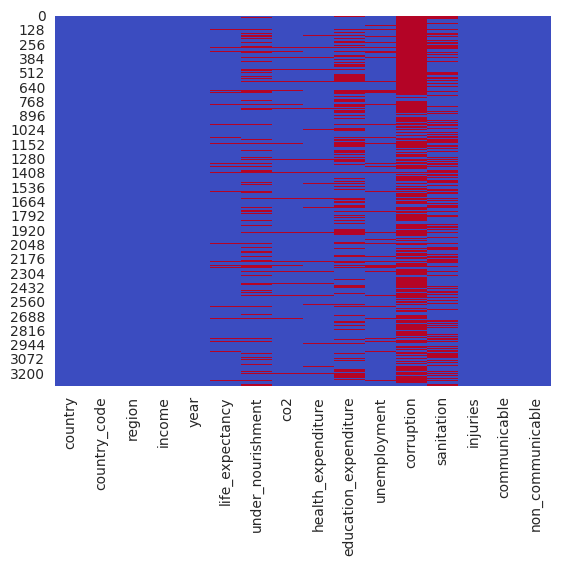

In [ ]:
sns.heatmap(df.isna(), cmap='coolwarm', cbar=False)
plt.show()

In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
df.nunique()

,0
country,174
country_code,174
region,7
income,4
year,19
life_expectancy,2964
under_nourishment,399
co2,2259
health_expenditure,3126
education_expenditure,2192


In [ ]:
# for numerical data
numeric_df = df.select_dtypes(include=['number'])
#print(numeric_df.head())
print(numeric_df.corr())

                           year  life_expectancy  under_nourishment       co2  \
year                   1.000000         0.203013          -0.144081  0.023258   
life_expectancy        0.203013         1.000000          -0.686749  0.130382   
under_nourishment     -0.144081        -0.686749           1.000000 -0.117334   
co2                    0.023258         0.130382          -0.117334  1.000000   
health_expenditure     0.093686         0.326404          -0.259551  0.109116   
education_expenditure  0.029346         0.208019          -0.248436 -0.042915   
unemployment          -0.050321        -0.056668          -0.037870 -0.058695   
corruption            -0.013471         0.263566          -0.307317  0.072381   
sanitation             0.117233         0.680025          -0.547040  0.097204   
injuries              -0.005951        -0.006020           0.012722  0.649054   
communicable          -0.037286        -0.217812           0.140288  0.206830   
non_communicable       0.018

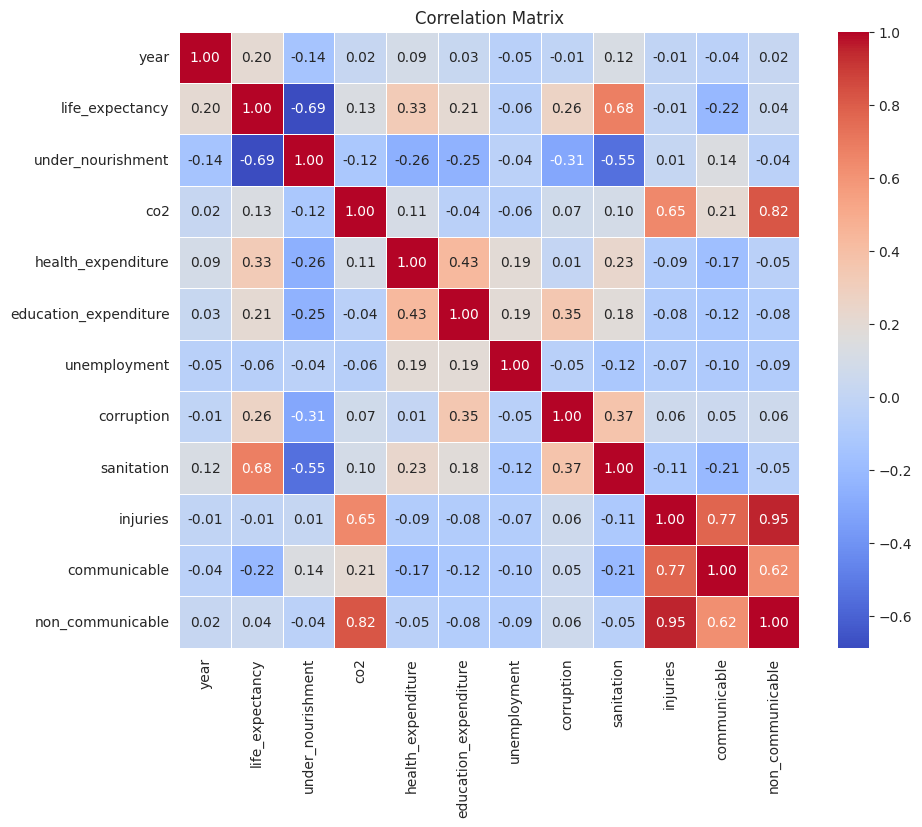

In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

In [ ]:
# for categorical data
categorical_df = df.select_dtypes(include=['object'])
#print(categorical_df.head())

df['region'].value_counts()
df['region'].value_counts(normalize=True) * 100

#df['IncomeGroup'].value_counts()
#df['IncomeGroup'].value_counts(normalize=True) * 100

,proportion
region,
Europe & Central Asia,27.011494
Sub-Saharan Africa,25.287356
Latin America & Caribbean,16.666667
East Asia & Pacific,15.517241
Middle East & North Africa,9.195402
South Asia,4.597701
North America,1.724138


In [ ]:
df['income'].value_counts()
df['income'].value_counts(normalize=True) * 100

,proportion
income,
High income,32.758621
Upper middle income,28.160920
Lower middle income,25.862069
Low income,13.218391


## Task 1.2 1) What is the current Life Expectancy?

In [ ]:
# 1) What is the current Life Expectancy?
stats_2019 = df[df['year'] == 2019]['life_expectancy']
print(stats_2019.describe())

count    164.000000
mean      72.589112
std        7.706562
min       53.283000
25%       67.094250
50%       74.231341
75%       78.444793
max       84.356341
Name: life_expectancy, dtype: float64


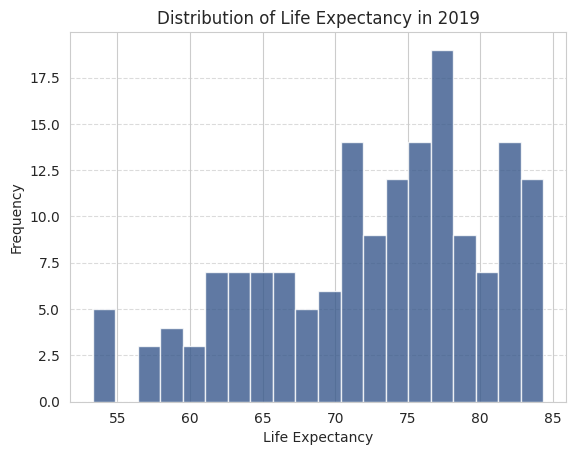

In [ ]:
# Histgram
plt.hist(stats_2019, bins=20, edgecolor='white', alpha=0.8, color=colors[2])

plt.title('Distribution of Life Expectancy in 2019')
plt.xlabel('Life Expectancy')
plt.ylabel('Frequency')

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()




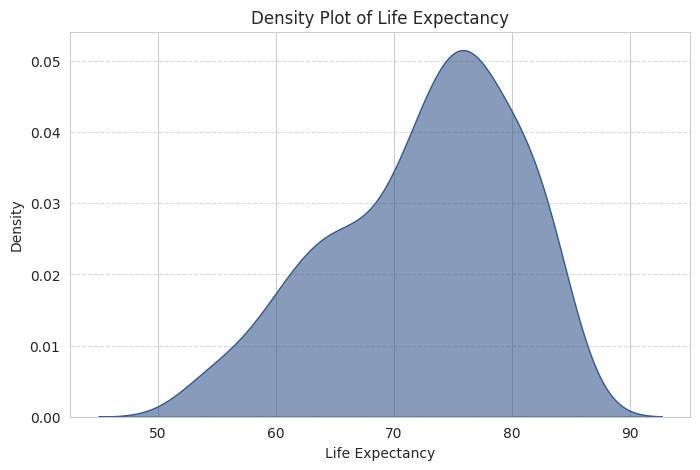

In [ ]:
# KDE
plt.figure(figsize=(8, 5))
sns.kdeplot(stats_2019, fill=True, color=colors[2], alpha=0.6)

plt.title('Density Plot of Life Expectancy')
plt.xlabel('Life Expectancy')
plt.ylabel('Density')

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()

## Task 1.2 2) How does Life Expectancy vary by country, and reagion?

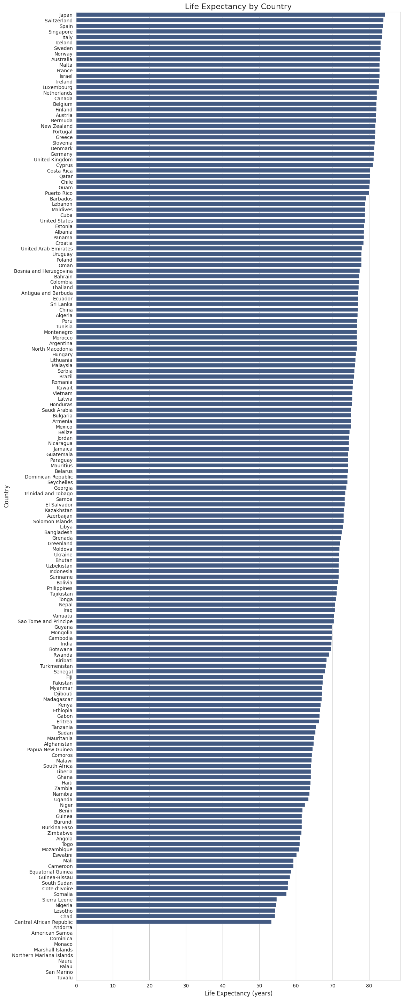

In [ ]:
# Bar graph by country
df_2019 = df[df['year'] == 2019].copy()

plt.figure(figsize=(12, 36))
sns.barplot(x='life_expectancy', y='country', data=df_2019.sort_values('life_expectancy', ascending=False), color=colors[2])

plt.title('Life Expectancy by Country', fontsize=16)
plt.xlabel('Life Expectancy (years)', fontsize=12)
plt.ylabel('Country', fontsize=12)

plt.show()

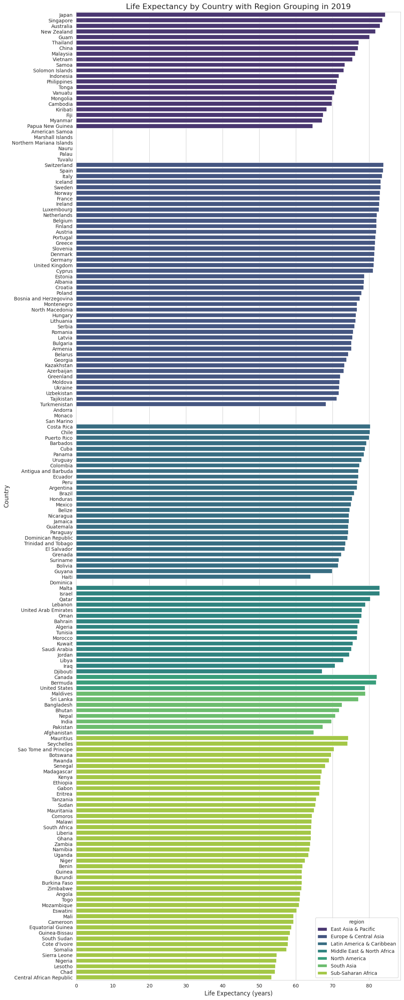

In [ ]:
# Bar graph by country and region
df_sorted = df_2019.sort_values(by=['region', 'life_expectancy'], ascending=[True, False])

plt.figure(figsize=(12, 36))
sns.barplot(x='life_expectancy', y='country', hue='region', data=df_sorted, dodge=False, palette="viridis")

plt.title('Life Expectancy by Country with Region Grouping in 2019', fontsize=16)
plt.xlabel('Life Expectancy (years)', fontsize=12)
plt.ylabel('Country', fontsize=12)

plt.show()



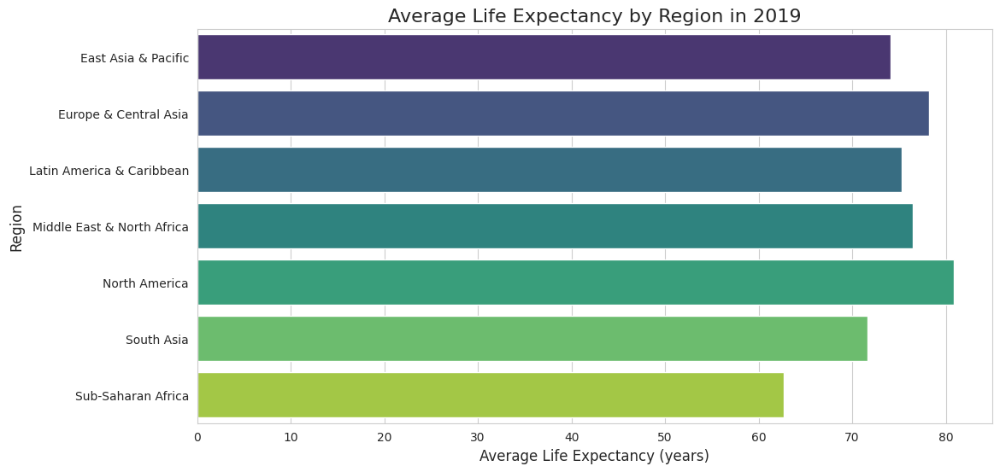

In [ ]:
# Bar graph by region
df_grouped = df_2019.groupby('region')['life_expectancy'].mean().reset_index()
plt.figure(figsize=(12, 6))
sns.barplot(x='life_expectancy', y='region', data=df_grouped, palette="viridis", hue='region', legend=False)

plt.title('Average Life Expectancy by Region in 2019', fontsize=16)
plt.xlabel('Average Life Expectancy (years)', fontsize=12)
plt.ylabel('Region', fontsize=12)

plt.show()




In [ ]:
#df = df.dropna(): if use this code, all of the countries which has Nan for the rest of variable are disapear.

df_2019 = df[df['year'] == 2019].dropna(subset=['country_code', 'life_expectancy'])

fig = px.choropleth(df_2019,
                    locations='country_code',
                    color='life_expectancy',
                    hover_name='country',
                    color_continuous_scale='RdYlBu',
                    title='Life Expectancy by Country in 2019')

fig.update_layout(geo=dict(showframe=False, showcoastlines=False, projection_type='equirectangular'))
fig.show()


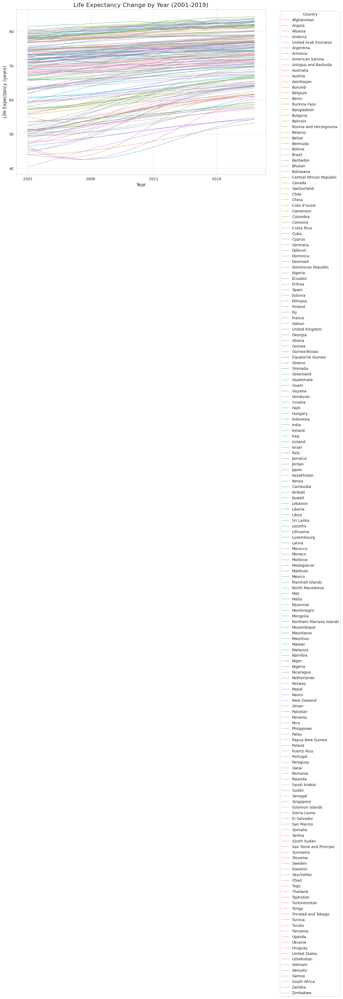

In [ ]:
# Spagetti graph, a typical bad graph

plt.figure(figsize=(12, 8))

sns.lineplot(x='year', y='life_expectancy', hue='country', data=df, lw=1, alpha=0.7)

plt.title('Life Expectancy Change by Year (2001-2019)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Life Expectancy (years)', fontsize=12)


plt.xticks(range(2001, 2020, 5))
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()


In [ ]:
#plt.figure(figsize=(12, 8))

#sns.lineplot(x='year', y='life_expectancy', hue='region', style='country', data=df, lw=1, alpha=0.7)

#plt.title('Life Expectancy Change by Year (2001-2019) by Region', fontsize=16)
#plt.xlabel('Year', fontsize=12)
#plt.ylabel('Life Expectancy (years)', fontsize=12)
#plt.xticks(range(2001, 2020, 5))
#plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')

#plt.show()





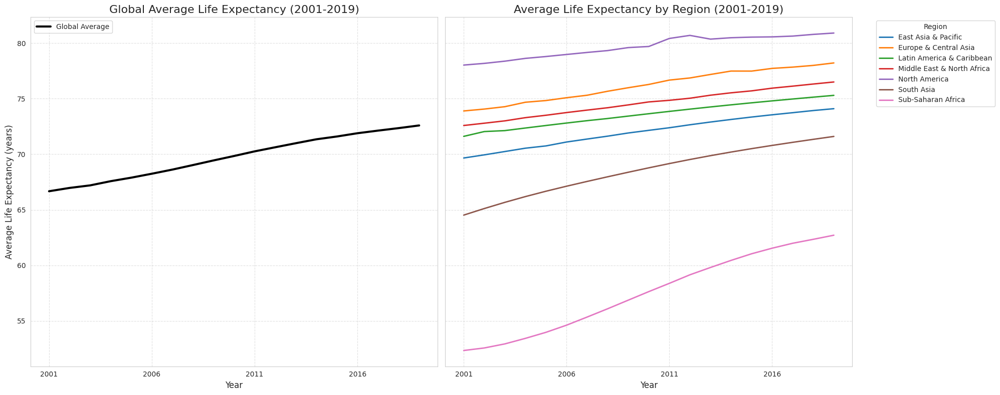

In [ ]:
df_region_avg = df.groupby(['year', 'region'])['life_expectancy'].mean().reset_index()

df_global_avg = df.groupby('year')['life_expectancy'].mean().reset_index()

fig, axes = plt.subplots(1, 2, figsize=(20, 8), sharey=True)

sns.lineplot(ax=axes[0], x='year', y='life_expectancy', data=df_global_avg, color='black', lw=3, label='Global Average')
axes[0].set_title('Global Average Life Expectancy (2001-2019)', fontsize=16)
axes[0].set_xlabel('Year', fontsize=12)
axes[0].set_ylabel('Average Life Expectancy (years)', fontsize=12)
axes[0].set_xticks(range(2001, 2020, 5))
axes[0].legend(loc='upper left')
axes[0].grid(True, linestyle='--', alpha=0.6)

sns.lineplot(ax=axes[1], x='year', y='life_expectancy', hue='region', data=df_region_avg, lw=2)
axes[1].set_title('Average Life Expectancy by Region (2001-2019)', fontsize=16)
axes[1].set_xlabel('Year', fontsize=12)
axes[1].set_xticks(range(2001, 2020, 5))
axes[1].legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()





## Task 1.2 3) What factors influence Life Expectancy?
- Our data contains 'life_expectancy' as outcome variables, and 'region'*,'income group''under_nourishment', 'co2', 'health_expenditure', 'education_expenditure', 'unemployment', 'corruption', 'sanitation', 'injuries', 'communicable', and 'non_communicable' as predictor variables (factors influencing the outcome). These predictor variables are known from the literature to be determinants of life expectancy.

- I. Pair plots to observe the overview.

- II. Close Examination the relationship between each predictor variable and life expectancy.

  i) categorical variables
      a) Income group
      b) Region *
  ii) numerical variables
      c) Under Nourishment
      d) CO2
      e) Health Expenditure
      f) Education Expenditure
      g) Unemployment
      h) Corruption
      i) Sanitation
      j) Injuries
      k) Communicable
      l) Non-Communicable

- * Generally, region and race can be predictors, but they are secondary. These factors relate to life expectancy due to social factors such as access to healthcare, socioeconomic status, and education.

#### 3) - I.Pair plot for overview

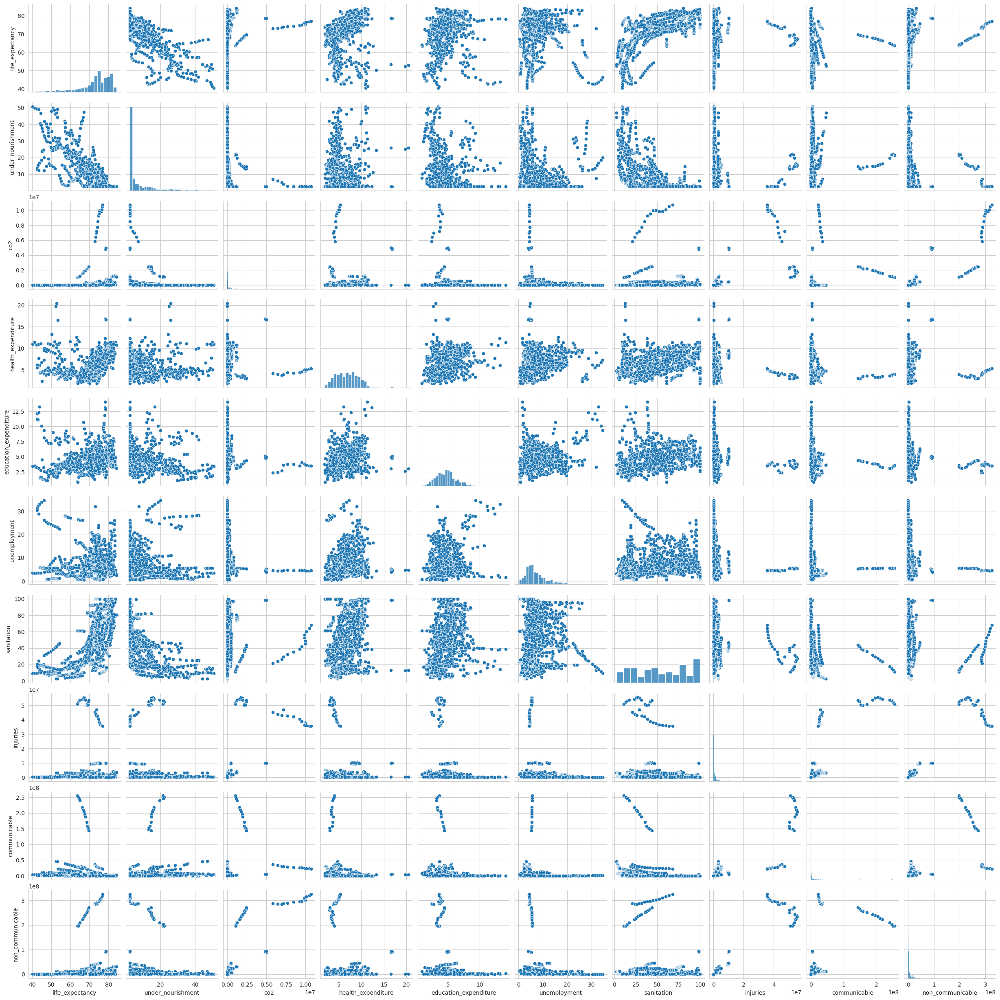

In [ ]:
# Pair plot for overview
# 'corrupition' was excluded becasue it contains too many Nan.

df_cleaned = df.dropna(subset=['country_code', 'region', 'income', 'life_expectancy',
                               'under_nourishment', 'co2', 'health_expenditure', 'education_expenditure',
                               'unemployment', 'sanitation', 'injuries',
                               'communicable', 'non_communicable']).copy()

sns.pairplot(df_cleaned[['region','income','life_expectancy', 'under_nourishment', 'co2', 'health_expenditure',
                         'education_expenditure', 'unemployment', 'sanitation',
                         'injuries', 'communicable', 'non_communicable']])

plt.show()


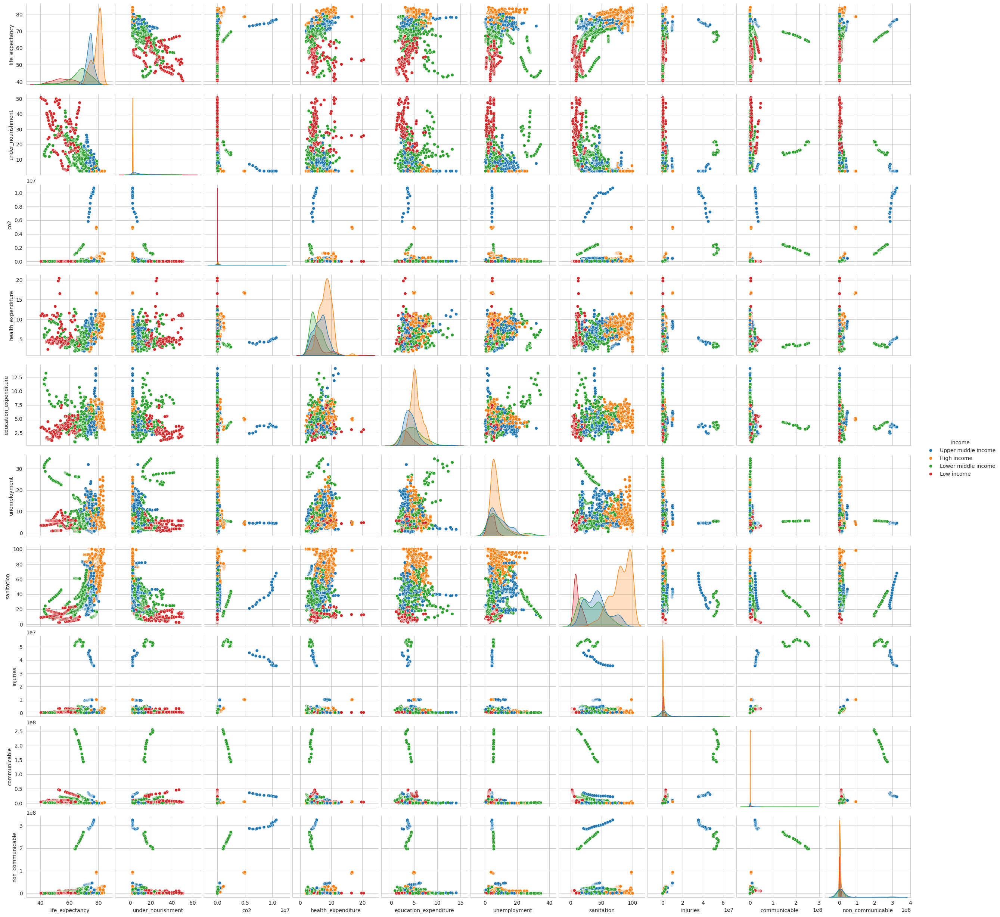

In [ ]:
# hue = "income"
sns.pairplot(df_cleaned[['region','income','life_expectancy', 'under_nourishment', 'co2', 'health_expenditure',
                         'education_expenditure', 'unemployment', 'sanitation',
                         'injuries', 'communicable', 'non_communicable']], hue = "income", diag_kind = "kde")

plt.show()

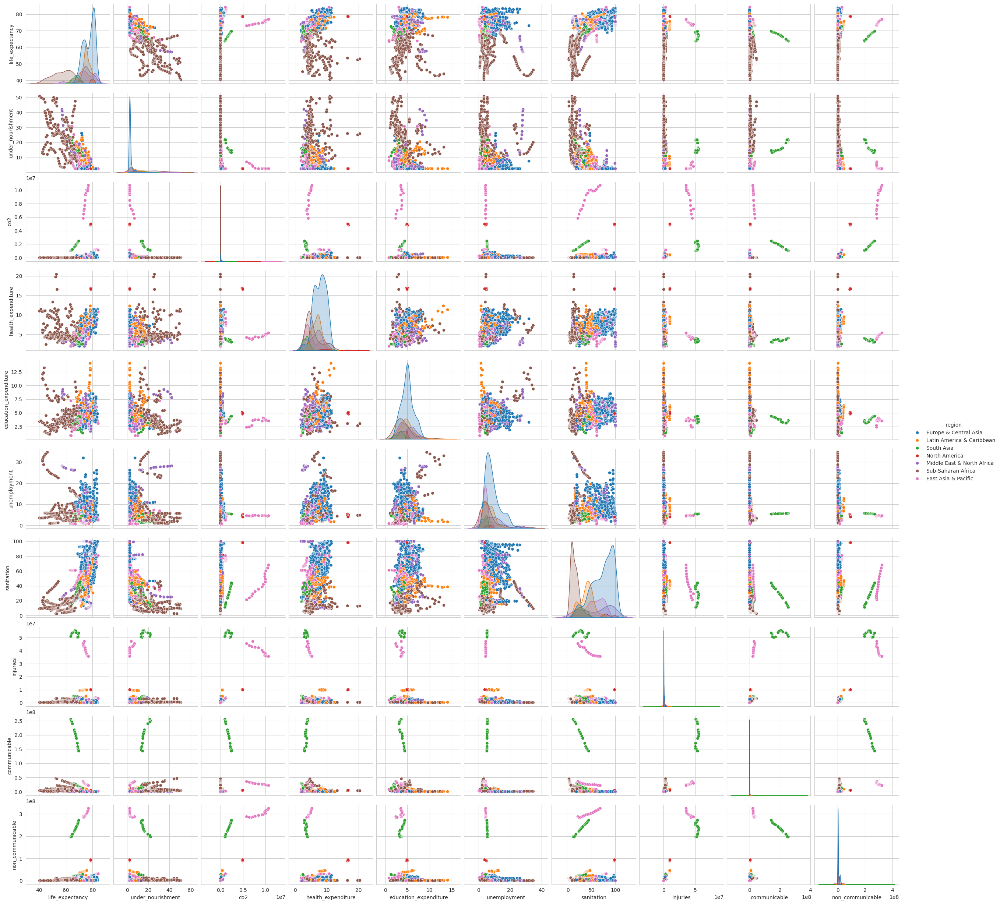

In [ ]:
# hue = "region"
sns.pairplot(df_cleaned[['region','income','life_expectancy', 'under_nourishment', 'co2', 'health_expenditure',
                         'education_expenditure', 'unemployment', 'sanitation',
                         'injuries', 'communicable', 'non_communicable']], hue = "region", diag_kind = "kde")

plt.show()

3) - II. Close Examination the relationship between each predictor variable and life expectancy.

    i) categorical variables
        a) Income group
        b) Region *

<ipython-input-313-b801a1ded34f>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


<ipython-input-313-b801a1ded34f>:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




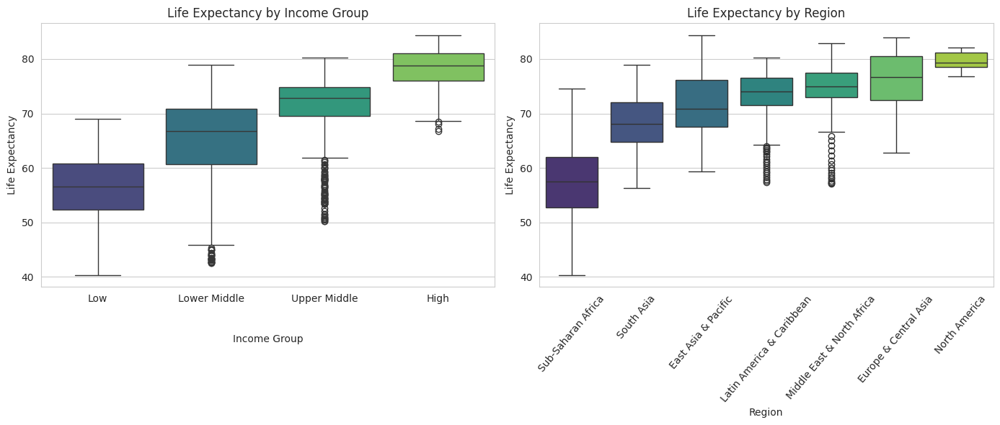

In [ ]:
# Box plots for categorical variables
df_cleaned = df.dropna(subset=['income', 'region','life_expectancy']).copy()

income_order = df_cleaned.groupby('income')['life_expectancy'].median().sort_values().index
region_order = df_cleaned.groupby('region')['life_expectancy'].median().sort_values().index

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.boxplot(data=df_cleaned, x='income', y='life_expectancy', ax=axes[0], order=income_order, palette='viridis')
axes[0].set_xlabel('Income Group', labelpad=30)
axes[0].set_ylabel('Life Expectancy')
axes[0].set_title('Life Expectancy by Income Group')
axes[0].set_xticks(range(len(['Low', 'Lower Middle', 'Upper Middle', 'High'])))
axes[0].set_xticklabels(['Low', 'Lower Middle', 'Upper Middle', 'High'])

sns.boxplot(data=df_cleaned, x='region', y='life_expectancy', ax=axes[1], order=region_order, palette='viridis')
axes[1].set_xlabel('Region')
axes[1].set_ylabel('Life Expectancy')
axes[1].set_title('Life Expectancy by Region')
axes[1].tick_params(axis='x', rotation=50)

plt.tight_layout()
plt.show()



II. Close Examination the relationship between each predictor variable and life expectancy.

  ii) numerical variables

    c) Under Nourishment
    d) CO2
    e) Health Expenditure
    f) Education Expenditure
    g) Unemployment
    h) Corruption
    i) Sanitation
    j) Injuries
    k) Communicable
    l) Non-Communicable

c) Under Nourishment vs Life expectancy

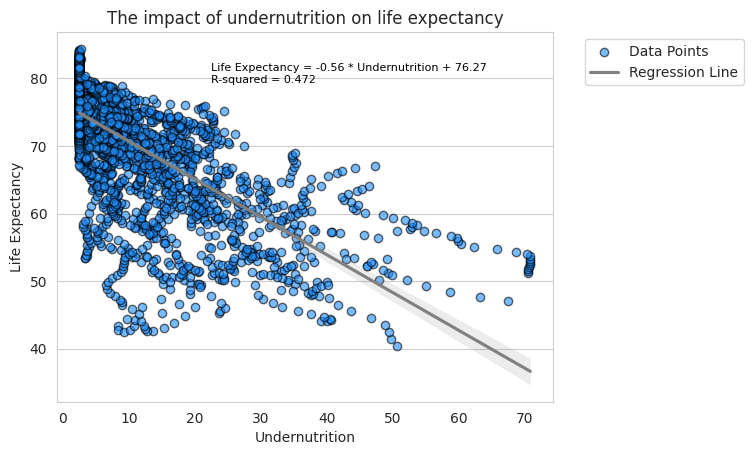

In [ ]:
# Scatter Plot
df_cleaned = df.dropna(subset=['under_nourishment','life_expectancy']).copy()

plt.scatter(df_cleaned['under_nourishment'], df_cleaned['life_expectancy'], color="dodgerblue", alpha=0.6, edgecolors="black", label="Data Points")
sns.regplot(data=df_cleaned, x="under_nourishment", y="life_expectancy", scatter=False, color="gray", label="Regression Line")

slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['under_nourishment'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Undernutrition + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['under_nourishment'] + 20), max(df_cleaned['life_expectancy']) - 5, equation_text, fontsize=8, color="black")

plt.xlabel('Undernutrition')
plt.ylabel("Life Expectancy")
plt.title("The impact of undernutrition on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()


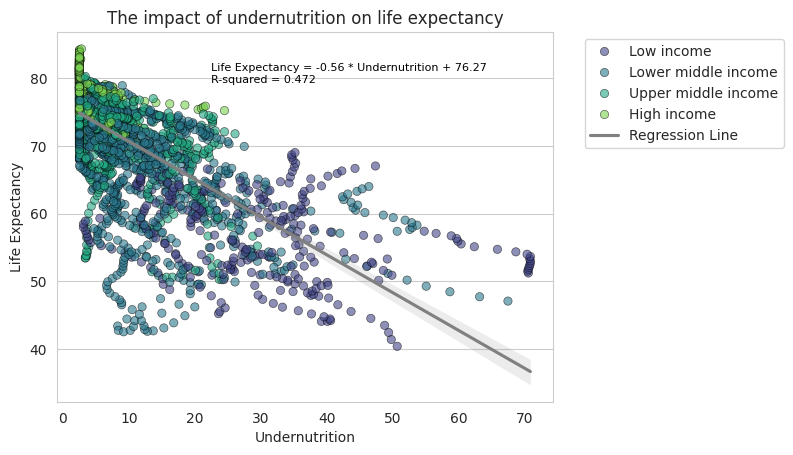

In [ ]:
#'life_expectancy', 'under_nourishment'
sns.scatterplot(data=df_cleaned, x='under_nourishment', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x="under_nourishment", y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['under_nourishment'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Undernutrition + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['under_nourishment']) + 20, max(df_cleaned['life_expectancy']) - 5, equation_text, fontsize=8, color="black")

plt.xlabel('Undernutrition')
plt.ylabel("Life Expectancy")
plt.title("The impact of undernutrition on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()



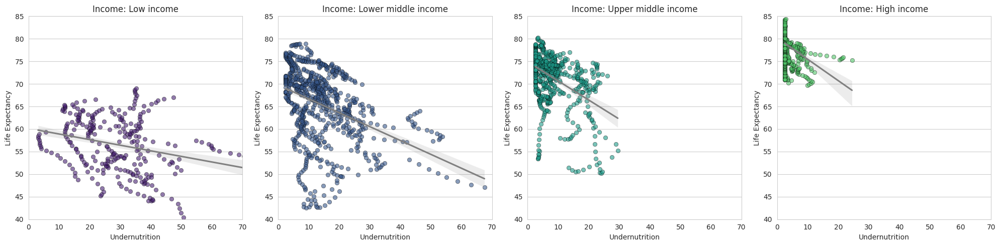

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]

    data_income_group = df_cleaned[df_cleaned['income'] == income_group]

    sns.scatterplot(data=data_income_group, x='under_nourishment', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)

    sns.regplot(data=data_income_group, x="under_nourishment", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")

    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['under_nourishment'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * Undernutrition + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
    #ax.text(65, 80, equation_text, fontsize=8, color="black", ha='right', va='top')

    ax.set_xlabel('Undernutrition')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    #ax.legend(loc='upper right')
    ax.set_xlim(0, 70)  # x-axis from 0 to 70
    ax.set_ylim(40, 85)  # y-axis from 40 to 85
    ax.grid(axis='x')

plt.tight_layout()
plt.show()


d) CO2 vs Life expectancy

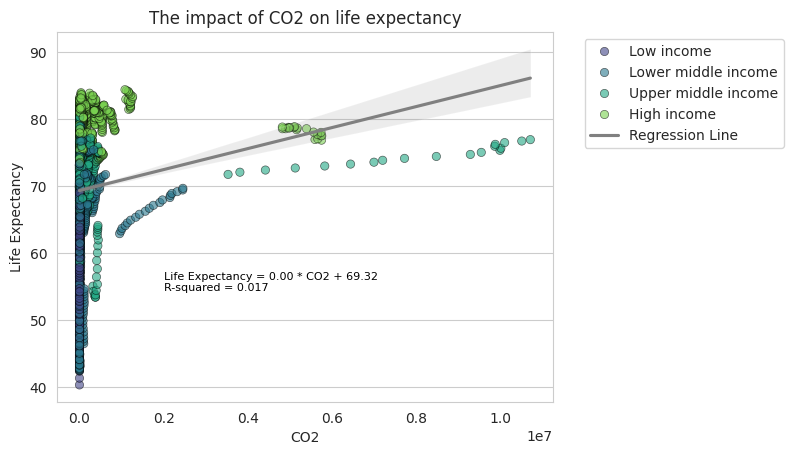

In [ ]:
#'life_expectancy', 'co2'
df_cleaned = df.dropna(subset=['co2','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='co2', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='co2', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['co2'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * CO2 + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['co2']) + 2000000 , max(df_cleaned['life_expectancy']) - 30, equation_text, fontsize=8, color="black")

plt.xlabel('CO2')
plt.ylabel("Life Expectancy")
plt.title("The impact of CO2 on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

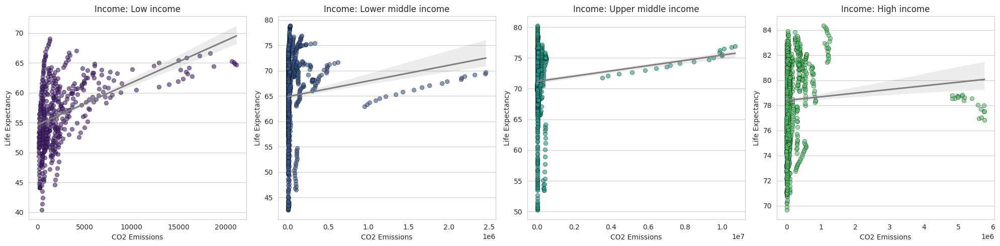

In [ ]:
#by income groups
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

# Loop through income groups and plot each one
for i, income_group in enumerate(income_groups):
    ax = axes[i]  # Select subplot for each income group

    # Filter data for each income group
    data_income_group = df_cleaned[df_cleaned['income'] == income_group]

    # Scatterplot with manually set colors
    sns.scatterplot(data=data_income_group, x='co2', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)

    # Regression line
    sns.regplot(data=data_income_group, x="co2", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")

    # Linear regression equation
    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['co2'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * CO2 + {intercept:.2f}\nR-squared = {r_value**2:.3f}'

    # Positioning the text in the upper-right corner under the legend
    #ax.text(10000, 45, equation_text, fontsize=8, color="black", ha='right', va='top')

    # Labels and title
    ax.set_xlabel('CO2 Emissions')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    ax.grid(axis='x')

    # Set legend
    #ax.legend(loc='upper right')

    # Set consistent axis limits
    #ax.set_xlim(0, 70)  # x-axis from 0 to 70
    #ax.set_ylim(40, 85)  # y-axis from 40 to 85

# Adjust layout
plt.tight_layout()
plt.show()

# The values are unusually large, and it is not possible to align the x-axis and y-axis.

In [ ]:
# check min & max
print(df_cleaned['co2'].max())
print(df_cleaned['co2'].min())
print(df_cleaned['co2'].head(10))


10707219.73
30.0
0        730.0
1      15960.0
2       3230.0
4      97200.0
5     125260.0
6       3600.0
8        350.0
9     345640.0
10     67910.0
11     26400.0
Name: co2, dtype: float64


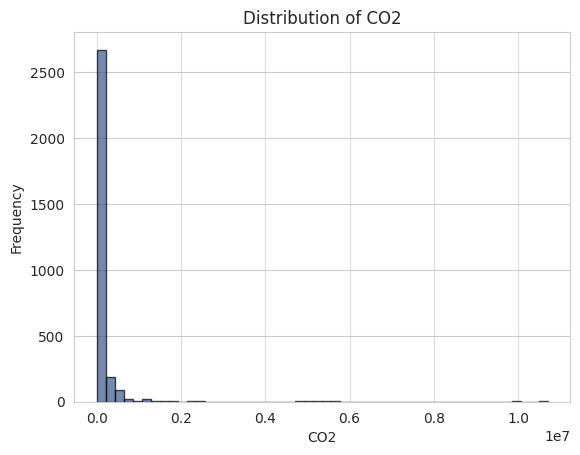

In [ ]:
# histgram
df_cleaned['co2'].hist(bins=50, color=colors[2], alpha=0.7, edgecolor = "black")
plt.title('Distribution of CO2')
plt.xlabel('CO2')
plt.ylabel('Frequency')
plt.title('Distribution of CO2')
plt.grid(axis='x', alpha=0.7)
plt.show()


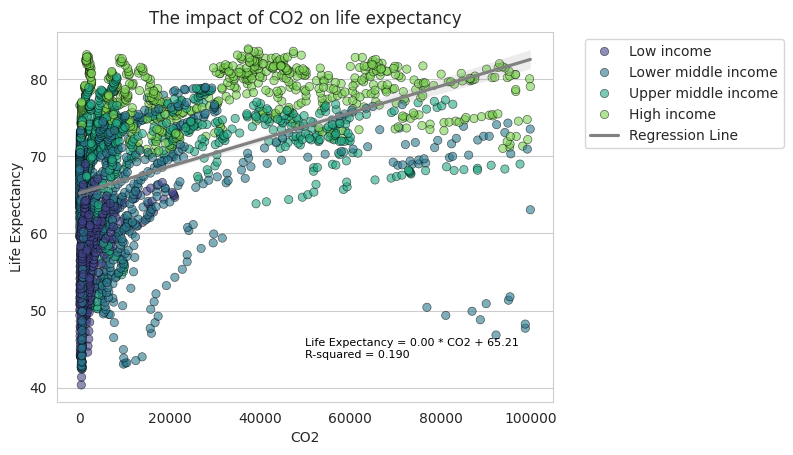

In [ ]:
# Filter the data for CO2 values less than or equal 100,000
df_filtered = df_cleaned[(df_cleaned['co2'] <= 100000)].copy()

sns.scatterplot(data=df_filtered, x='co2', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_filtered, x='co2', y="life_expectancy", scatter=False, color="gray", label="Regression Line")

slope, intercept, r_value, p_value, std_err = stats.linregress(df_filtered['co2'], df_filtered['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * CO2 + {intercept:.2f}\nR-squared = {r_value**2:.3f}'

plt.text(min(df_filtered['co2']) + 50000, max(df_filtered['life_expectancy']) - 40, equation_text, fontsize=8, color="black")

plt.xlabel('CO2')
plt.ylabel("Life Expectancy")
plt.title("The impact of CO2 on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

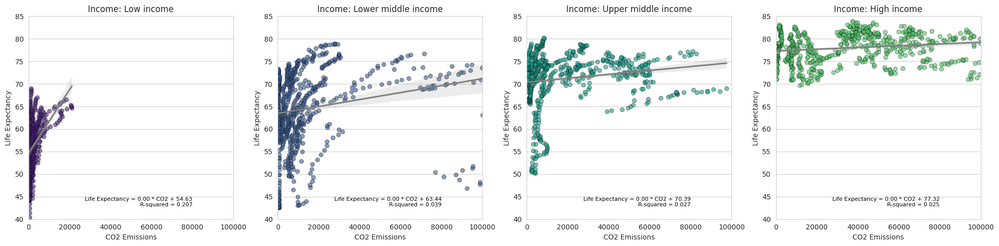

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

df_filtered = df_cleaned[(df_cleaned['co2'] <= 100000)]

for i, income_group in enumerate(income_groups):
    ax = axes[i]

    data_income_group = df_filtered[df_filtered['income'] == income_group]

    sns.scatterplot(data=data_income_group, x='co2', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)

    sns.regplot(data=data_income_group, x="co2", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")

    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['co2'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * CO2 + {intercept:.2f}\nR-squared = {r_value**2:.3f}'

    ax.text(80000, 45, equation_text, fontsize=8, color="black", ha='right', va='top')
    ax.set_xlabel('CO2 Emissions')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    ax.grid(axis='x')

    # Set legend
    #ax.legend(loc='upper right')

    # Set consistent axis limits
    ax.set_xlim(0, 100000)
    ax.set_ylim(40, 85)

plt.tight_layout()
plt.show()

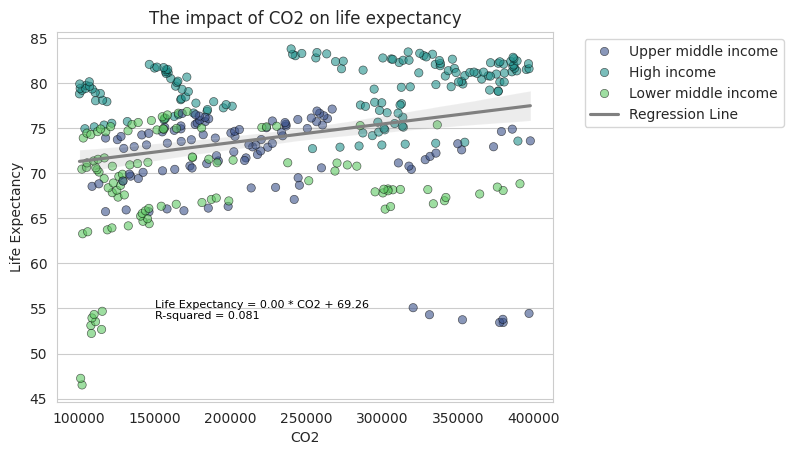

In [ ]:
# Filter the data for CO2 values between 100,000 and 400,000
df_filtered = df_cleaned[(df_cleaned['co2'] > 100000) & (df_cleaned['co2'] <= 400000)].copy()

sns.scatterplot(data=df_filtered, x='co2', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_filtered, x='co2', y="life_expectancy", scatter=False, color="gray", label="Regression Line")

slope, intercept, r_value, p_value, std_err = stats.linregress(df_filtered['co2'], df_filtered['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * CO2 + {intercept:.2f}\nR-squared = {r_value**2:.3f}'

plt.text(min(df_filtered['co2']) + 50000, max(df_filtered['life_expectancy']) - 30, equation_text, fontsize=8, color="black")

plt.xlabel('CO2')
plt.ylabel("Life Expectancy")
plt.title("The impact of CO2 on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

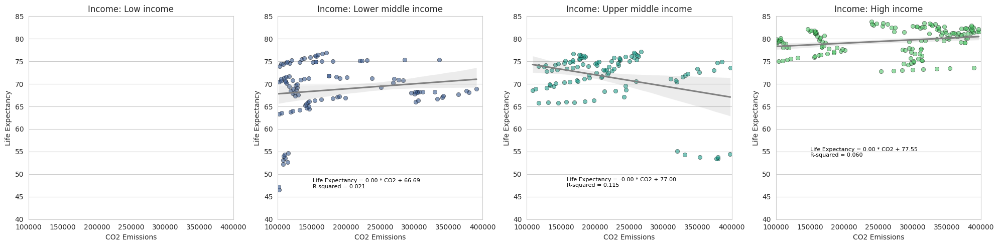

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

df_filtered = df_cleaned[(df_cleaned['co2'] > 100000) & (df_cleaned['co2'] <= 400000)]

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_filtered[df_filtered['income'] == income_group]

    if not data_income_group.empty:
        sns.scatterplot(data=data_income_group, x='co2', y='life_expectancy',
                        color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)
        sns.regplot(data=data_income_group, x="co2", y="life_expectancy", scatter=False,
                    color="gray", ax=ax, label="Regression Line")
        slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['co2'], data_income_group['life_expectancy'])
        equation_text = f'Life Expectancy = {slope:.2f} * CO2 + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
        ax.text(min(data_income_group['co2']) + 50000, max(data_income_group['life_expectancy']) - 30, equation_text, fontsize=8, color="black")

    else:
        ax.set_title(f"No Data for {income_group}")
        ax.set_xlabel('CO2 Emissions')
        ax.set_ylabel("Life Expectancy")

    ax.set_xlabel('CO2 Emissions')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    ax.grid(axis='x')

    # Set legend
    #ax.legend(loc='upper right')

    ax.set_xlim(100000, 400000)
    ax.set_ylim(40, 85)

plt.tight_layout()
plt.show()



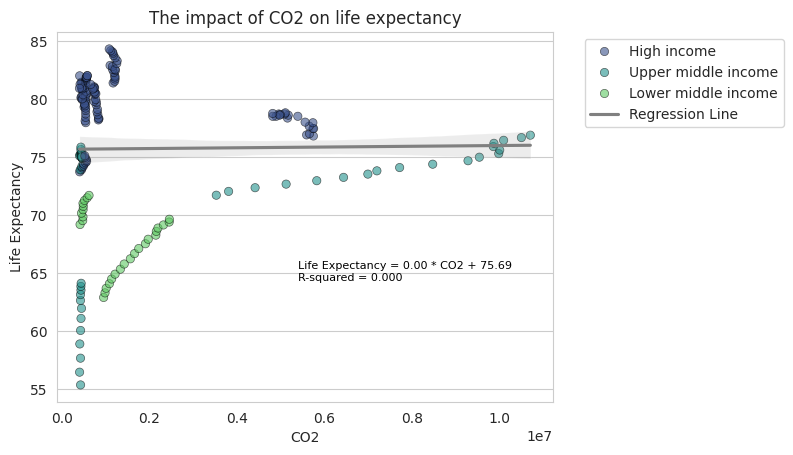

In [ ]:
# Filter the data for CO2 values more than or equal 400,000
df_filtered = df_cleaned[(df_cleaned['co2'] > 400000)].copy()

sns.scatterplot(data=df_filtered, x='co2', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_filtered, x='co2', y="life_expectancy", scatter=False, color="gray", label="Regression Line")

slope, intercept, r_value, p_value, std_err = stats.linregress(df_filtered['co2'], df_filtered['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * CO2 + {intercept:.2f}\nR-squared = {r_value**2:.3f}'

plt.text(min(df_filtered['co2']) + 5000000, max(df_filtered['life_expectancy']) - 20, equation_text, fontsize=8, color="black")

plt.xlabel('CO2')
plt.ylabel("Life Expectancy")
plt.title("The impact of CO2 on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

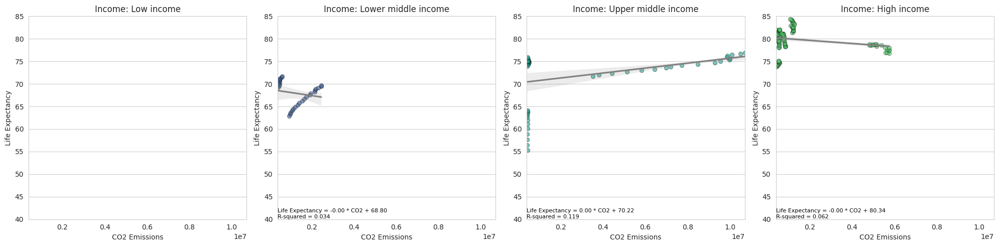

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

df_filtered = df_cleaned[(df_cleaned['co2'] > 400000)].copy()

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_filtered[df_filtered['income'] == income_group]
    if not data_income_group.empty:
        sns.scatterplot(data=data_income_group, x='co2', y='life_expectancy',
                        color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)
        sns.regplot(data=data_income_group, x="co2", y="life_expectancy", scatter=False,
                    color="gray", ax=ax, label="Regression Line")
        slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['co2'], data_income_group['life_expectancy'])
        equation_text = f'Life Expectancy = {slope:.2f} * CO2 + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
        ax.text(400000, 40, equation_text, fontsize=8, color="black", ha='left', va='bottom')
    else:
        ax.set_title(f"No Data for {income_group}")
        ax.set_xlabel('CO2 Emissions')
        ax.set_ylabel("Life Expectancy")

    ax.set_xlabel('CO2 Emissions')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    #ax.legend(loc='upper right')
    ax.set_xlim(400000, df_filtered['co2'].max())  # x-axis from 400000 to max co2
    ax.set_ylim(40, 85)  # y-axis from 40 to 85
    ax.grid(axis='x')

plt.tight_layout()
plt.show()

In [ ]:
filtered_data_highco2 = df_cleaned[df_cleaned['co2'] >= 400000][['country', 'income', 'co2']]
print(filtered_data_highco2)

             country               income           co2
29            Canada          High income  5.066200e+05
32             China  Upper middle income  3.529080e+06
40           Germany          High income  8.476800e+05
55    United Kingdom          High income  5.452600e+05
72             India  Lower middle income  9.535400e+05
...              ...                  ...           ...
3212           Japan          High income  1.081570e+06
3231          Mexico  Upper middle income  4.492700e+05
3268    Saudi Arabia          High income  5.237800e+05
3298   United States          High income  4.817720e+06
3303    South Africa  Upper middle income  4.396400e+05

[197 rows x 3 columns]


In [ ]:
filtered_data_highco2_highincome = df_cleaned[(df_cleaned['co2'] >= 400000) & (df_cleaned['income'] == 'High income')][['country', 'income', 'co2']]
print(filtered_data_highco2_highincome)

             country       income           co2
29            Canada  High income  5.066200e+05
40           Germany  High income  8.476800e+05
55    United Kingdom  High income  5.452600e+05
77             Italy  High income  4.365700e+05
80             Japan  High income  1.170380e+06
...              ...          ...           ...
3161          Canada  High income  5.802100e+05
3172         Germany  High income  6.574000e+05
3212           Japan  High income  1.081570e+06
3268    Saudi Arabia  High income  5.237800e+05
3298   United States  High income  4.817720e+06

[111 rows x 3 columns]


In [ ]:
filtered_data_highco2 = df_cleaned[df_cleaned['co2'] >= 4000000][['country', 'income', 'co2']]
print(filtered_data_highco2)

            country               income           co2
166   United States          High income  5.748260e+06
340   United States          High income  5.593030e+06
380           China  Upper middle income  4.415910e+06
514   United States          High income  5.658990e+06
554           China  Upper middle income  5.124820e+06
688   United States          High income  5.738290e+06
728           China  Upper middle income  5.824630e+06
862   United States          High income  5.753490e+06
902           China  Upper middle income  6.437470e+06
1036  United States          High income  5.653080e+06
1076          China  Upper middle income  6.993180e+06
1210  United States          High income  5.736320e+06
1250          China  Upper middle income  7.199600e+06
1384  United States          High income  5.558380e+06
1424          China  Upper middle income  7.719070e+06
1558  United States          High income  5.156430e+06
1598          China  Upper middle income  8.474920e+06
1732  Unit

In [ ]:
filtered_data_highco2_highincome = df_cleaned[(df_cleaned['co2'] >= 4000000) & (df_cleaned['income'] == 'High income')][['country', 'income', 'co2']]
print(filtered_data_highco2_highincome)

            country       income          co2
166   United States  High income  5748260.000
340   United States  High income  5593029.785
514   United States  High income  5658990.234
688   United States  High income  5738290.039
862   United States  High income  5753490.234
1036  United States  High income  5653080.078
1210  United States  High income  5736319.824
1384  United States  High income  5558379.883
1558  United States  High income  5156430.176
1732  United States  High income  5392109.863
1906  United States  High income  5173600.098
2080  United States  High income  4956060.059
2254  United States  High income  5092100.098
2428  United States  High income  5107209.961
2602  United States  High income  4990709.961
2776  United States  High income  4894500.000
2950  United States  High income  4819370.117
3124  United States  High income  4975310.059
3298  United States  High income  4817720.215


e) Health Expenditure vs Health Expenditure

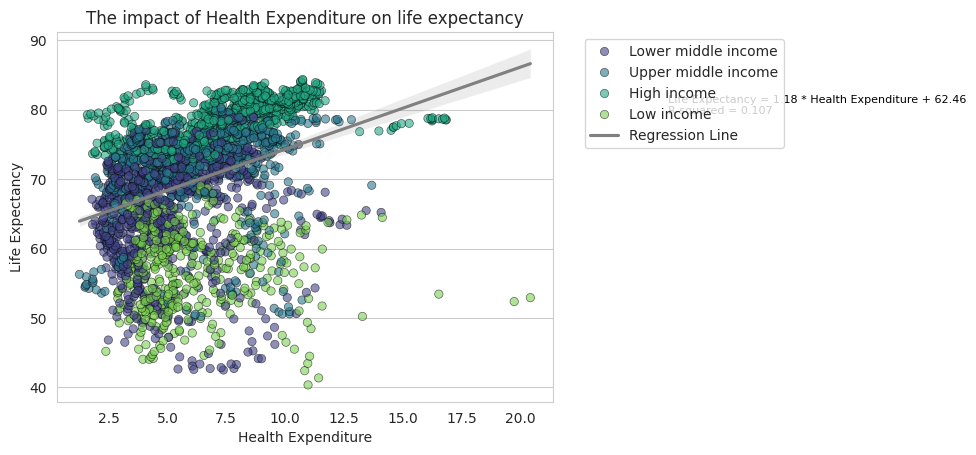

In [ ]:
#'life_expectancy','health_expenditure'
df_cleaned = df.dropna(subset=['health_expenditure','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='health_expenditure', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='health_expenditure', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['health_expenditure'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Health Expenditure + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['health_expenditure']) + 25, max(df_cleaned['life_expectancy']) - 5, equation_text, fontsize=8, color="black")

plt.xlabel('Health Expenditure')
plt.ylabel("Life Expectancy")
plt.title("The impact of Health Expenditure on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

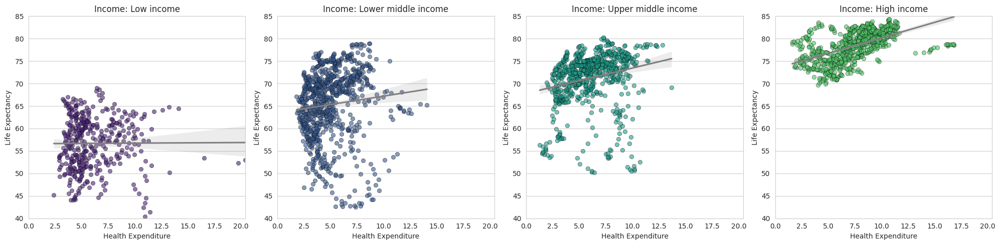

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_cleaned[df_cleaned['income'] == income_group]
    sns.scatterplot(data=data_income_group, x='health_expenditure', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)
    sns.regplot(data=data_income_group, x="health_expenditure", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")
    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['health_expenditure'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * Health Expenditure + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
    #ax.text(min(data_income_group['health_expenditure']) + 2.8, max(data_income_group['life_expectancy']) - 38,
    #        equation_text, fontsize=8, color="black")
    ax.set_xlabel('Health Expenditure')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    #ax.legend(loc='upper right')
    ax.set_xlim(0, df_cleaned['health_expenditure'].max())
    ax.set_ylim(40, 85)
    ax.grid(axis='x')

plt.tight_layout()
plt.show()


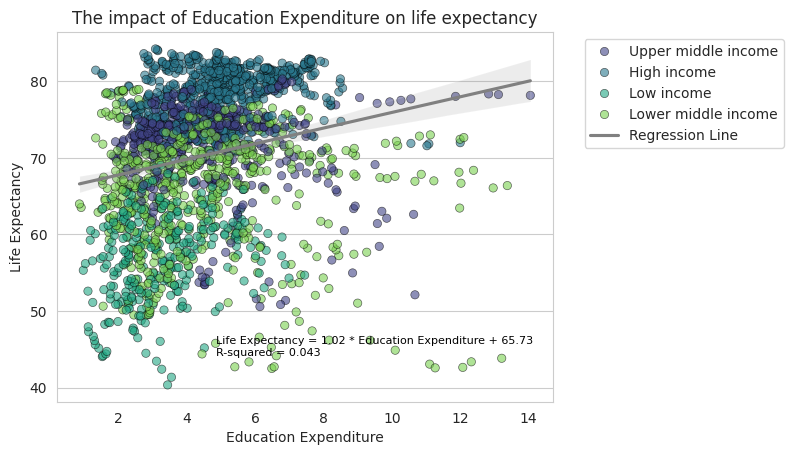

In [ ]:
#'life_expectancy','education_expenditure'
df_cleaned = df.dropna(subset=['education_expenditure','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='education_expenditure', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='education_expenditure', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['education_expenditure'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Education Expenditure + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['education_expenditure']) + 4, max(df_cleaned['life_expectancy']) - 40, equation_text, fontsize=8, color="black")

plt.xlabel('Education Expenditure')
plt.ylabel("Life Expectancy")
plt.title("The impact of Education Expenditure on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

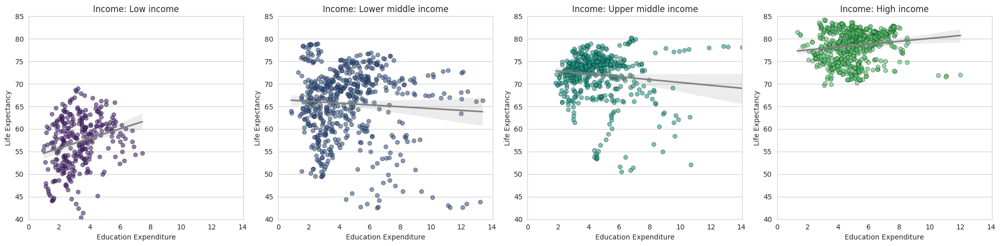

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_cleaned[df_cleaned['income'] == income_group]
    sns.scatterplot(data=data_income_group, x='education_expenditure', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)
    sns.regplot(data=data_income_group, x="education_expenditure", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")
    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['education_expenditure'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * Education Expenditure + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
    #ax.text(min(data_income_group['education_expenditure']) + 25, max(data_income_group['life_expectancy']) - 5,
    #        equation_text, fontsize=8, color="black")
    ax.set_xlabel('Education Expenditure')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    #ax.legend(loc='upper right')
    ax.set_xlim(0, df_cleaned['education_expenditure'].max())  # x-axis from 0 to max education_expenditure
    ax.set_ylim(40, 85)  # y-axis from 40 to 85
    ax.grid(axis='x')

plt.tight_layout()
plt.show()


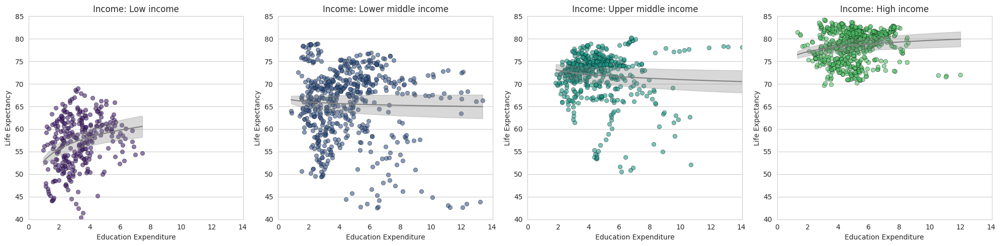

In [ ]:
# try logarithmic regression
from scipy.optimize import curve_fit

def log_model(x, a, b):
    return a * np.log(x) + b

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_cleaned[df_cleaned['income'] == income_group]

    sns.scatterplot(data=data_income_group, x='education_expenditure', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)

    x_data = data_income_group['education_expenditure'].values
    y_data = data_income_group['life_expectancy'].values

    mask = x_data > 0
    x_data, y_data = x_data[mask], y_data[mask]

    popt, pcov = curve_fit(log_model, x_data, y_data, maxfev=10000)

    perr = np.sqrt(np.diag(pcov))

    x_fit = np.linspace(min(x_data), max(x_data), 100)
    y_fit = log_model(x_fit, *popt)

    y_fit_upper = log_model(x_fit, popt[0] + perr[0], popt[1] + perr[1])
    y_fit_lower = log_model(x_fit, popt[0] - perr[0], popt[1] - perr[1])

    ax.plot(x_fit, y_fit, color="gray", label="Logarithmic Fit")
    ax.fill_between(x_fit, y_fit_lower, y_fit_upper, color='gray', alpha=0.3, label="95% CI")

    equation_text = f'Life Expectancy = {popt[0]:.2f} * log(Education Expenditure) + {popt[1]:.2f}'
    # ax.text(min(x_data) + 10, max(y_data) - 5, equation_text, fontsize=8, color="black")

    ax.set_xlabel('Education Expenditure')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    ax.set_xlim(0, df_cleaned['education_expenditure'].max())
    ax.set_ylim(40, 85)
    ax.grid(axis='x')

plt.tight_layout()
plt.show()


Still, it doesn't fit well. Perhaps spending too much on education doesn't have an effect.

g) Unemployment vs Life expectancy

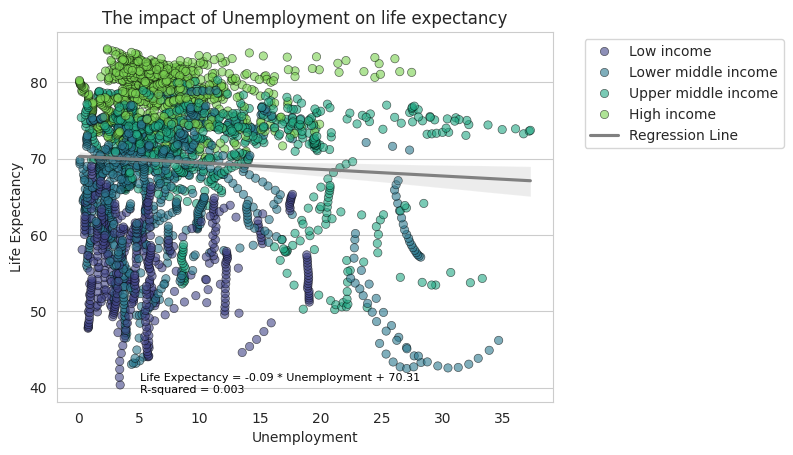

In [ ]:
# 'life_expectancy',  'unemployment'
df_cleaned = df.dropna(subset=['unemployment','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='unemployment', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='unemployment', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['unemployment'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Unemployment + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['unemployment']) + 5, max(df_cleaned['life_expectancy']) - 45, equation_text, fontsize=8, color="black")

plt.xlabel('Unemployment')
plt.ylabel("Life Expectancy")
plt.title("The impact of Unemployment on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

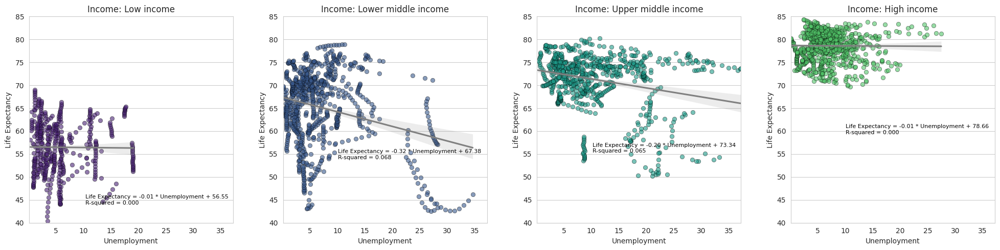

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']

color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_cleaned[df_cleaned['income'] == income_group]
    sns.scatterplot(data=data_income_group, x='unemployment', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)
    sns.regplot(data=data_income_group, x="unemployment", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")

    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['unemployment'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * Unemployment + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
    ax.text(min(data_income_group['unemployment']) + 10,
            max(data_income_group['life_expectancy']) - 25,
            equation_text, fontsize=8, color="black")

    ax.set_xlabel('Unemployment')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    ax.set_xlim(min(df_cleaned['unemployment']), df_cleaned['unemployment'].max())
    ax.set_ylim(40, 85)
    ax.grid(axis='x')

plt.tight_layout()
plt.show()



h) Corruption vs Life Expectancy

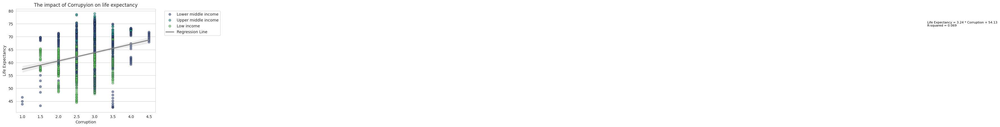

In [ ]:
# 'life_expectancy', 'corruption'
df_cleaned = df.dropna(subset=['corruption','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='corruption', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='corruption', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['corruption'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Corruption + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['corruption']) + 25, max(df_cleaned['life_expectancy']) - 5, equation_text, fontsize=8, color="black")

plt.xlabel('Corruption')
plt.ylabel("Life Expectancy")
plt.title("The impact of Corrupyion on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

'corruption' is numerical data, but it is a scale. It has an order. I think that it should be treated as a categorical variable.

- What is the corruption scale?

-- The World Bank Governance Indicators assess governance and corruption on a scale from -2.5 to +2.5. This is used to measure the quality of governance in a broad range of areas such as politics, administration, legal systems, regulation, and the control of corruption.

-- The Corruption Perceptions Index (CPI) specifically focuses on 'perceptions of corruption' and is evaluated on a scale from 0 to 100. This index measures government transparency, the quality of public services, the level of corruption in business, and other related factors. Based on the opinions of experts and institutions, it evaluates how widespread corruption is.

-- It is unclear whether the Kaggle data is based on the World Bank Governance Indicators or CPI, but if the scale converges from 1 to 5, it is highly likely that this data is an indicator of the level of corruption. It can be interpreted as follows:

**1: High level of corruption**

**3: Slightly fewer corruption issues**  

**5: Nearly no corruption**

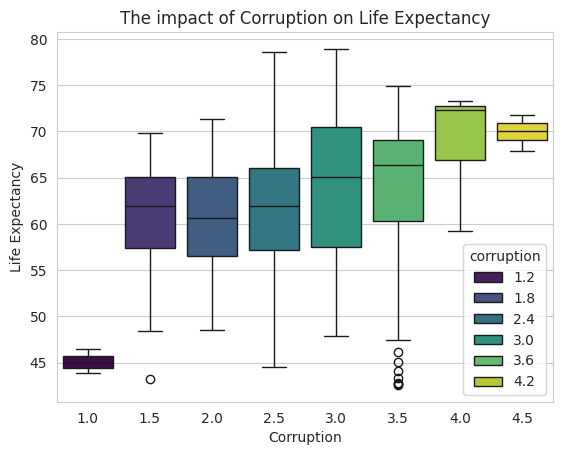

In [ ]:
# Box plot
sns.boxplot(data=df_cleaned, x='corruption', y='life_expectancy', hue='corruption', palette='viridis')

plt.xlabel('Corruption')
plt.ylabel("Life Expectancy")
plt.title("The impact of Corruption on Life Expectancy")

plt.show()


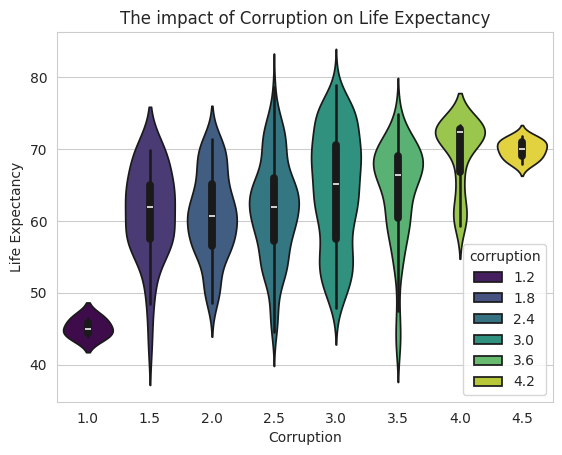

In [ ]:
# Violin plot
sns.violinplot(data=df_cleaned, x='corruption', y='life_expectancy', hue='corruption', palette='viridis')

plt.xlabel('Corruption')
plt.ylabel("Life Expectancy")
plt.title("The impact of Corruption on Life Expectancy")

plt.show()


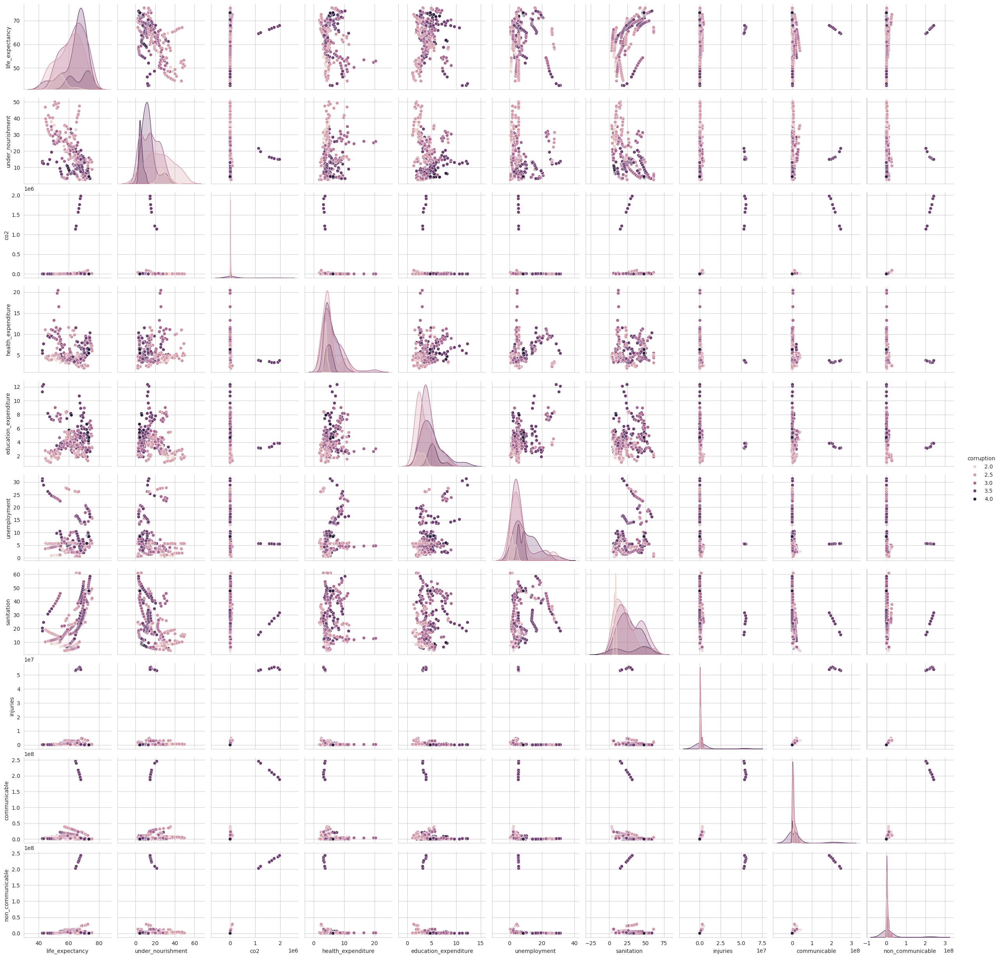

In [ ]:
# Pair plot for overview

df_cleaned = df.dropna(subset=['country_code', 'region', 'income', 'life_expectancy',
                               'under_nourishment', 'co2', 'health_expenditure', 'education_expenditure',
                               'unemployment', 'sanitation', 'injuries',
                               'communicable', 'non_communicable', 'corruption']).copy()

sns.pairplot(df_cleaned[['region','income','life_expectancy', 'under_nourishment', 'co2', 'health_expenditure',
                         'education_expenditure', 'unemployment', 'sanitation',
                         'injuries', 'communicable', 'non_communicable', 'corruption']], hue = "corruption", diag_kind = "kde")
plt.show()

i) Sanitation vs Life Expectancy

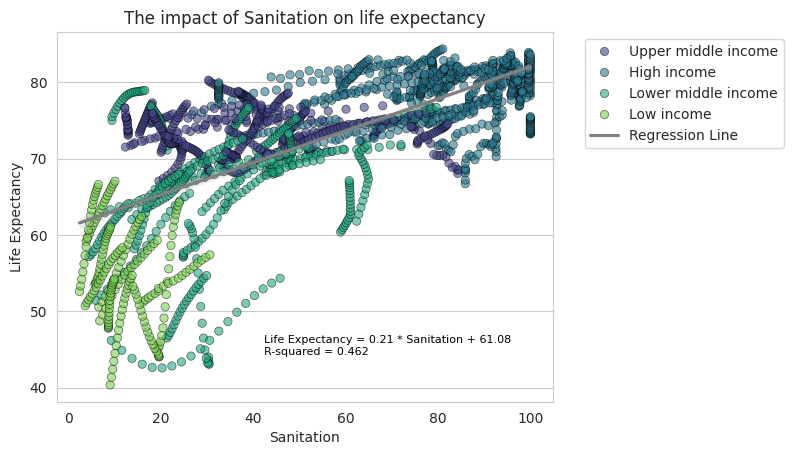

In [ ]:
# 'life_expectancy', 'sanitation'
df_cleaned = df.dropna(subset=['sanitation','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='sanitation', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='sanitation', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['sanitation'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Sanitation + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['sanitation']) + 40, max(df_cleaned['life_expectancy']) - 40, equation_text, fontsize=8, color="black")

plt.xlabel('Sanitation')
plt.ylabel("Life Expectancy")
plt.title("The impact of Sanitation on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

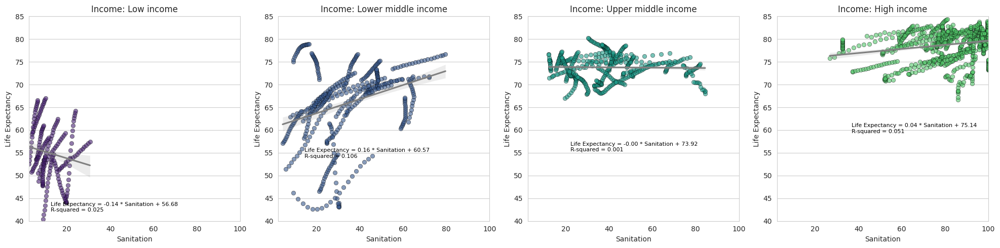

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']
color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_cleaned[df_cleaned['income'] == income_group]
    sns.scatterplot(data=data_income_group, x='sanitation', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)
    sns.regplot(data=data_income_group, x="sanitation", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")

    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['sanitation'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * Sanitation + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
    ax.text(min(data_income_group['sanitation']) + 10,
            max(data_income_group['life_expectancy']) - 25,
            equation_text, fontsize=8, color="black")

    ax.set_xlabel('Sanitation')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    ax.set_xlim(min(df_cleaned['sanitation']), df_cleaned['sanitation'].max())
    ax.set_ylim(40, 85)
    ax.grid(axis='x')

plt.tight_layout()
plt.show()





j) Injuries

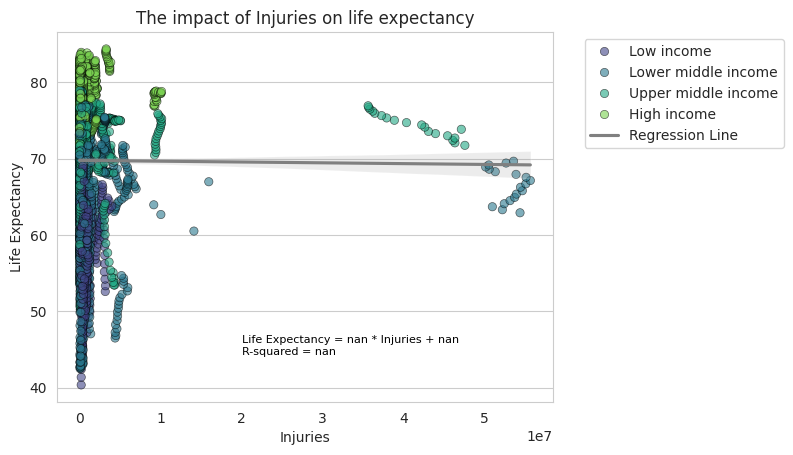

In [ ]:
# 'life_expectancy', 'injuries'
df_cleaned = df.dropna(subset=['injuries','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='injuries', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='injuries', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['sanitation'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Injuries + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['injuries']) +20000000, max(df_cleaned['life_expectancy']) - 40, equation_text, fontsize=8, color="black")

plt.xlabel('Injuries')
plt.ylabel("Life Expectancy")
plt.title("The impact of Injuries on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

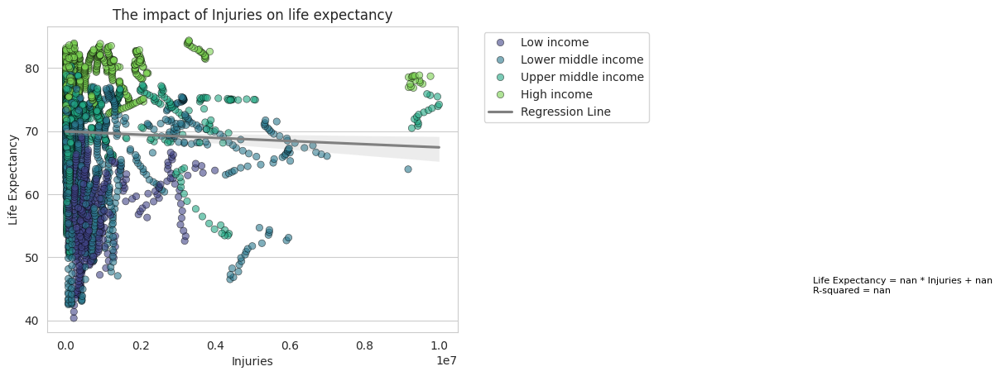

In [ ]:
# injuriesの値が異常に大きいものを除外

df_filtered = df_cleaned[(df_cleaned['injuries'] < 10000000) ].copy()

sns.scatterplot(data=df_filtered, x='injuries', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_filtered, x='injuries', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_filtered['sanitation'], df_filtered['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Injuries + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_filtered['injuries']) +20000000, max(df_filtered['life_expectancy']) - 40, equation_text, fontsize=8, color="black")

plt.xlabel('Injuries')
plt.ylabel("Life Expectancy")
plt.title("The impact of Injuries on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

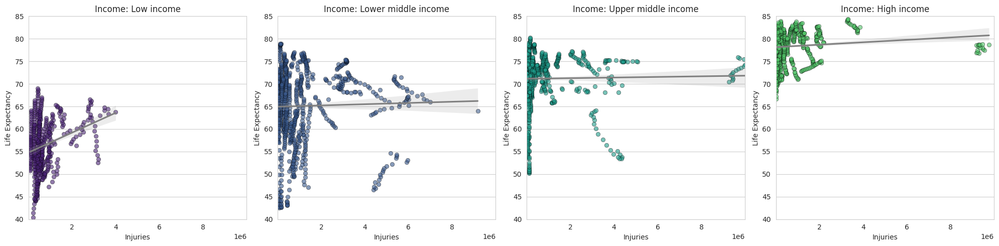

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']
color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_filtered[df_filtered['income'] == income_group]
    sns.scatterplot(data=data_income_group, x='injuries', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)
    sns.regplot(data=data_income_group, x="injuries", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")

    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['injuries'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * Injuries + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
    #ax.text(min(data_income_group['injuries']) + 20000000,
    #        max(data_income_group['life_expectancy']) - 40,
    #        equation_text, fontsize=8, color="black")

    ax.set_xlabel('Injuries')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    ax.set_xlim(min(df_filtered['injuries']), df_filtered['injuries'].max())
    ax.set_ylim(40, 85)
    ax.grid(axis='x')

plt.tight_layout()
plt.show()


k) Communicable

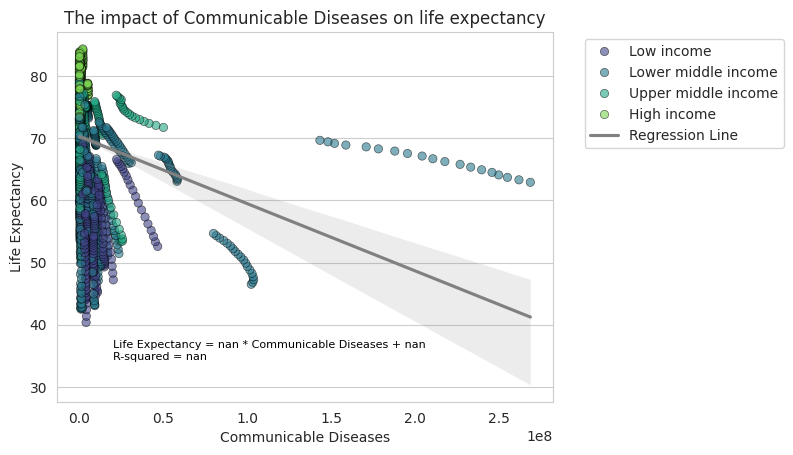

In [ ]:
# 'life_expectancy', 'communicable'

df_cleaned = df.dropna(subset=['communicable','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='communicable', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='communicable', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['sanitation'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Communicable Diseases + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['communicable']) +20000000, max(df_cleaned['life_expectancy']) - 50, equation_text, fontsize=8, color="black")

plt.xlabel('Communicable Diseases')
plt.ylabel("Life Expectancy")
plt.title("The impact of Communicable Diseases on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

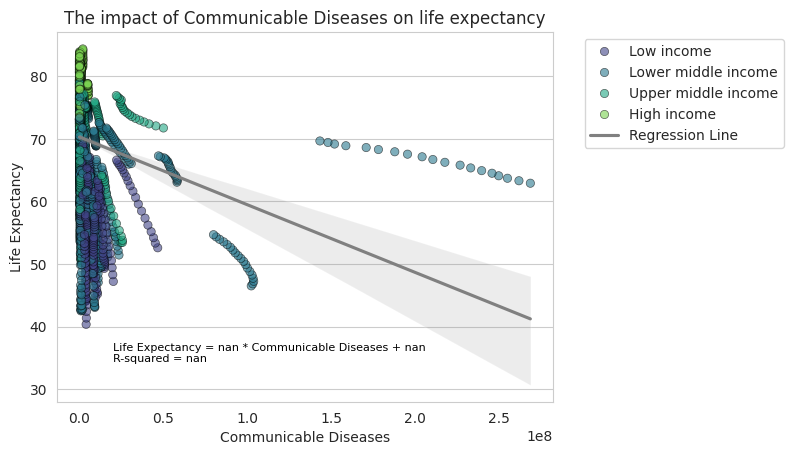

In [ ]:
# 'life_expectancy', 'communicable'

df_cleaned = df.dropna(subset=['communicable','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='communicable', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='communicable', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['sanitation'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Communicable Diseases + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['communicable']) +20000000, max(df_cleaned['life_expectancy']) - 50, equation_text, fontsize=8, color="black")

plt.xlabel('Communicable Diseases')
plt.ylabel("Life Expectancy")
plt.title("The impact of Communicable Diseases on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

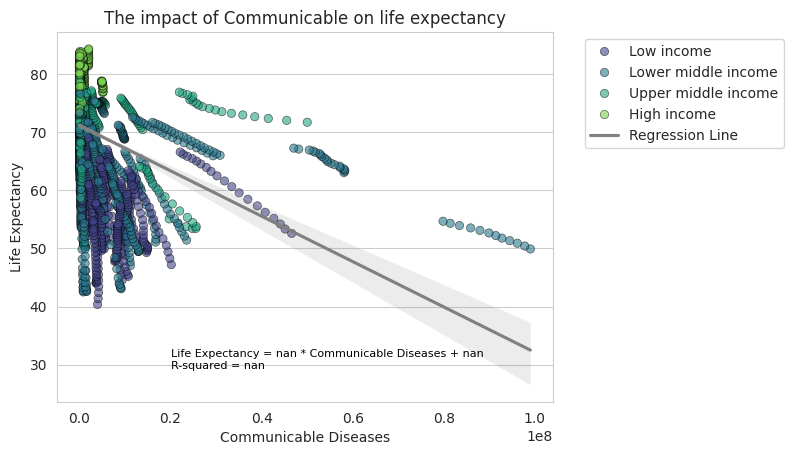

In [ ]:
# 'communucable'の値が異常に大きいものを除外

df_filtered = df_cleaned[(df_cleaned['communicable'] < 100000000) ].copy()

sns.scatterplot(data=df_filtered, x='communicable', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_filtered, x='communicable', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_filtered['sanitation'], df_filtered['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Communicable Diseases + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_filtered['communicable']) +20000000, max(df_filtered['life_expectancy']) - 55, equation_text, fontsize=8, color="black")

plt.xlabel('Communicable Diseases')
plt.ylabel("Life Expectancy")
plt.title("The impact of Communicable on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

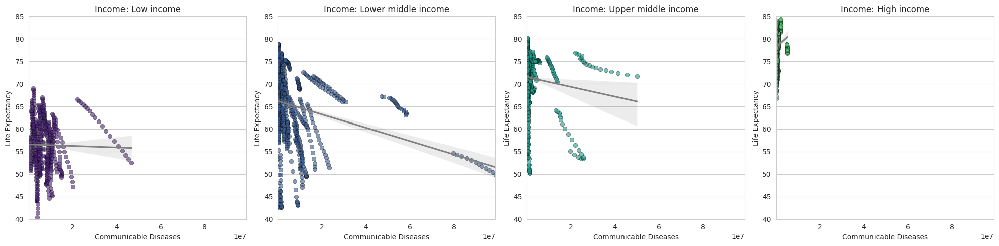

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']
color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_filtered[df_filtered['income'] == income_group]
    sns.scatterplot(data=data_income_group, x='communicable', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)
    sns.regplot(data=data_income_group, x="communicable", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")

    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['communicable'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * Communicable Diseases + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
    #ax.text(min(data_income_group['communicable']) + 20000000,
    #        max(data_income_group['life_expectancy']) - 25,
    #        equation_text, fontsize=8, color="black")

    ax.set_xlabel('Communicable Diseases')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    ax.set_xlim(min(df_filtered['communicable']), df_filtered['communicable'].max())
    ax.set_ylim(40, 85)
    ax.grid(axis='x')

plt.tight_layout()
plt.show()


l) Non-Communicable

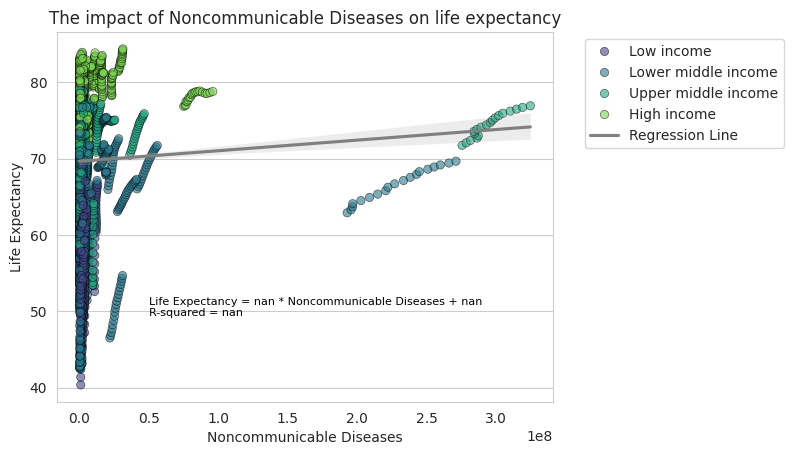

In [ ]:
# 'life_expectancy', 'non_communicable'

df_cleaned = df.dropna(subset=['non_communicable','life_expectancy']).copy()
sns.scatterplot(data=df_cleaned, x='non_communicable', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_cleaned, x='non_communicable', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_cleaned['sanitation'], df_cleaned['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Noncommunicable Diseases + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_cleaned['non_communicable']) +50000000, max(df_cleaned['life_expectancy']) - 35, equation_text, fontsize=8, color="black")

plt.xlabel('Noncommunicable Diseases')
plt.ylabel("Life Expectancy")
plt.title("The impact of Noncommunicable Diseases on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

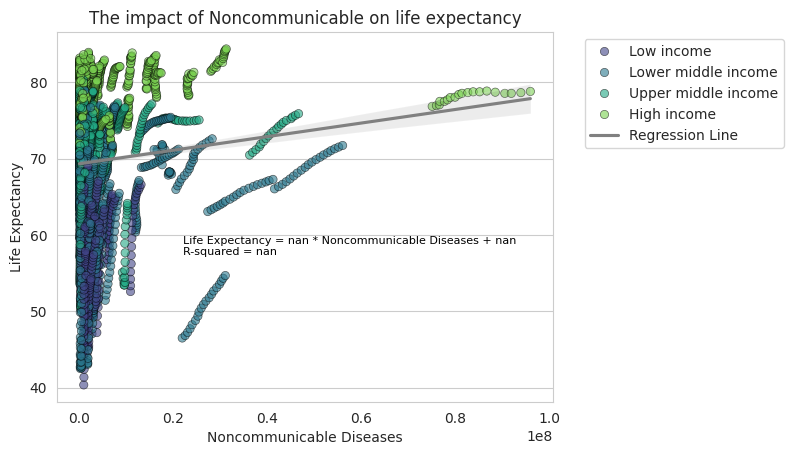

In [ ]:
# 'non_communucable'の値が異常に大きいものを除外

df_filtered = df_cleaned[(df_cleaned['non_communicable'] < 100000000) ].copy()

sns.scatterplot(data=df_filtered, x='non_communicable', y='life_expectancy', hue='income', palette='viridis', alpha=0.6, edgecolor="black")

sns.regplot(data=df_filtered, x='non_communicable', y="life_expectancy", scatter=False, color="gray", label="Regression Line")
slope, intercept, r_value, p_value, std_err = stats.linregress(df_filtered['sanitation'], df_filtered['life_expectancy'])
equation_text = f'Life Expectancy = {slope:.2f} * Noncommunicable Diseases + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
plt.text(min(df_filtered['non_communicable']) +22000000, max(df_filtered['life_expectancy']) - 27, equation_text, fontsize=8, color="black")

plt.xlabel('Noncommunicable Diseases')
plt.ylabel("Life Expectancy")
plt.title("The impact of Noncommunicable on life expectancy")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='x')

plt.show()

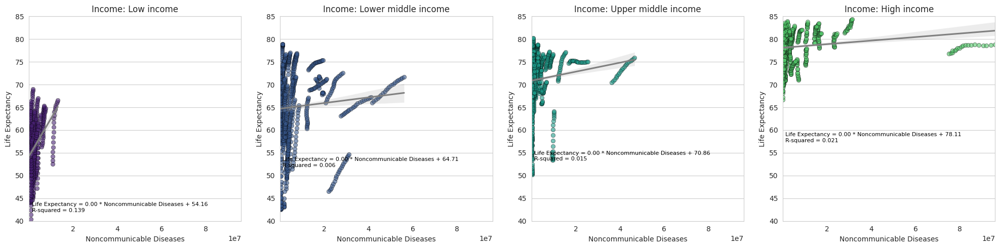

In [ ]:
income_groups = ['Low income', 'Lower middle income', 'Upper middle income', 'High income']
color_map = {
    'Low income': colors[0],
    'Lower middle income': colors[2],
    'Upper middle income': colors[5],
    'High income': colors[7]
}

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, income_group in enumerate(income_groups):
    ax = axes[i]
    data_income_group = df_filtered[df_filtered['income'] == income_group]
    sns.scatterplot(data=data_income_group, x='non_communicable', y='life_expectancy',
                    color=color_map[income_group], alpha=0.6, edgecolor="black", ax=ax)
    sns.regplot(data=data_income_group, x="non_communicable", y="life_expectancy", scatter=False,
                color="gray", ax=ax, label="Regression Line")

    slope, intercept, r_value, p_value, std_err = stats.linregress(data_income_group['non_communicable'], data_income_group['life_expectancy'])
    equation_text = f'Life Expectancy = {slope:.2f} * Noncommunicable Diseases + {intercept:.2f}\nR-squared = {r_value**2:.3f}'
    ax.text(min(data_income_group['non_communicable']) + 1100000,
            max(data_income_group['life_expectancy']) - 27,
            equation_text, fontsize=8, color="black")

    ax.set_xlabel('Noncommunicable Diseases')
    ax.set_ylabel("Life Expectancy")
    ax.set_title(f"Income: {income_group}")
    ax.set_xlim(min(df_filtered['non_communicable']), df_filtered['non_communicable'].max())
    ax.set_ylim(40, 85)
    ax.grid(axis='x')

plt.tight_layout()
plt.show()



# Data Analysis of the Life Expectancy Data
The stepwise method is not recommended due to the potential for overfitting. In this case, the correlation was assessed using the correlation matrix, and features with high correlations (above 0.8) were excluded.

Feature selection was based on prior literature, which identified variables such as Income Group, Region, GDP, Income Composition of Resources, Schooling, Alcohol, BMI, Polio, Total Expenditure, HIV/AIDS, Access to Clean Water, and Sanitation as important.

The variables in this dataset are expected to have strong relationships with life expectancy, as indicated by the literature review (referenced sources).

However, some of the variables exhibit high correlations with one another. Including highly correlated variables in the same model can lead to multicollinearity, which may decrease the accuracy and interpretability of the prediction model. Generally, if the correlation coefficient between variables exceeds 0.7, it is recommended to avoid including these variables together in the model. In this dataset, the correlation between injuries and non_communicable is 0.95, between injuries and communicable is 0.77, between CO2 and non_communicable is 0.82, and between sanitation and life_expectancy is 0.68. Therefore, injuries, CO2, and sanitation were excluded from the model.

For other variables:
Numerical variable analysis: Linear regression was used.
Categorical variable analysis: Logistic regression or Random Forest was applied.

The prediction model chosen was Random Forest regression.
The model's accuracy was evaluated using Mean Squared Error (MSE).

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor


from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.metrics import r2_score


In [24]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [25]:
file_path = '/content/drive/My Drive/life_exp_kaggle_full.csv'
df = pd.read_csv(file_path)

df.rename({'Country Name': 'country',
           'Country Code': 'country_code',
           'Region': 'region',
           'IncomeGroup': 'income',
           'Year': 'year',
           'Life Expectancy World Bank': 'life_expectancy',
           'Prevelance of Undernourishment': 'under_nourishment',
           'CO2': 'co2',
           'Health Expenditure %': 'health_expenditure',
           'Education Expenditure %': 'education_expenditure',
           'Unemployment': 'unemployment',
           'Corruption': 'corruption',
           'Sanitation': 'sanitation',
           'Injuries': 'injuries',
           'Communicable': 'communicable',
           'NonCommunicable': 'non_communicable'}, axis=1, inplace=True)

df_cleaned = df.dropna(subset=['under_nourishment', 'health_expenditure', 'education_expenditure',
                'unemployment', 'communicable', 'non_communicable', 'income', 'corruption']).copy()

# Encode categorical variable: 'income'.  # Should I consider 'corruption as category variable?
income_group_mapping = {'Low income': 1, 'Lower middle income': 2, 'Upper middle income': 3, 'High income': 4}
df_cleaned['income_group_encoded'] = df_cleaned['income'].map(income_group_mapping)

# Define features and target variable
X = df_cleaned[['under_nourishment', 'health_expenditure', 'education_expenditure',
                'unemployment', 'communicable', 'non_communicable', 'income_group_encoded', 'corruption']]
y = df_cleaned['life_expectancy']

# Split into training and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the linear regression model
linear_model = LinearRegression()
linear_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred = linear_model.predict(X_test_scaled)

# Evaluate model
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error (Linear Regression): {mse}")

# Save the model and the standardization scaler
joblib.dump(linear_model, 'linear_model_1.pkl')
joblib.dump(scaler, 'scaler_1.pkl')

Mean Squared Error (Linear Regression): 33.707820395607385


['scaler_1.pkl']

In [ ]:
# Load Model 1
#linear_model_1 = joblib.load('linear_model_1.pkl')
#scaler_1 = joblib.load('scaler_1.pkl')

### **Assumptions for Applying a Linear Regression Model**  

- 1. **Linearity**  

- 2. **Normal Distribution of Residuals**  

- 3. **Multicollinearity**  
Multicolinearity(+): Breusch-Pagan Test p-value < 0.05.  

- 4. **Heteroscedasticity (Unequal Variance of Residuals)**
-- VIF Interpretation:
-- VIF < 5: No issue (low multicollinearity)
-- 5 ≤ VIF < 10: Moderate multicollinearity (needs caution)
-- VIF ≥ 10: Severe multicollinearity (consider removing or addressing variables)

If these assumptions are not met, consider using other regression methods, such as **Random Forest Regression** or **Ridge Regression**.


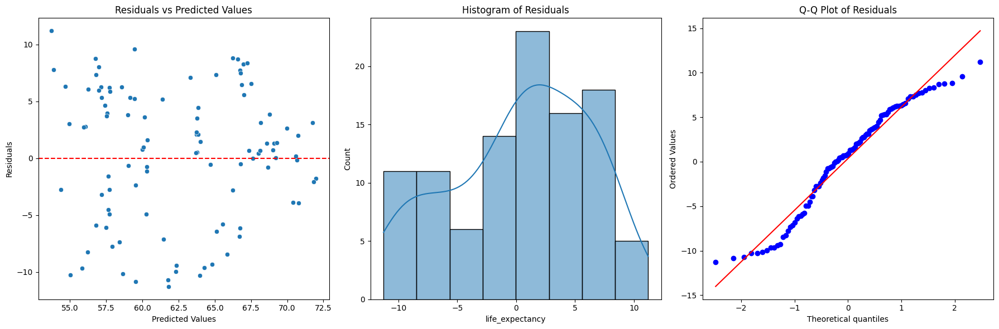

Breusch-Pagan Test Statistics: 59.049928221760325
Breusch-Pagan Test p-value: 7.156682008716453e-10
                Variable        VIF
0                  const   1.000000
1      under_nourishment   1.650190
2     health_expenditure   1.334656
3  education_expenditure   1.197103
4           unemployment   1.337356
5           communicable  15.913166
6       non_communicable  15.649290
7   income_group_encoded   1.776009
8             corruption   1.222136


In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor

#1. Normal Distribution of Residuals
residuals = y_test - y_pred
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
# Residual Plot
sns.scatterplot(x=y_pred, y=residuals, ax=axes[0])
axes[0].axhline(0, color='r', linestyle='--')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals')
axes[0].set_title('Residuals vs Predicted Values')
# Histogram of residuals
sns.histplot(residuals, kde=True, ax=axes[1])
axes[1].set_title('Histogram of Residuals')
# Q-Q Plot
stats.probplot(residuals, dist="norm", plot=axes[2])
axes[2].set_title('Q-Q Plot of Residuals')
# Adjust layout
plt.tight_layout()
plt.show()

# 3. Check for Heteroscedasticity
# Add a constant term
X_train_with_const = sm.add_constant(X_train_scaled)
# Fit the linear regression model
linear_model = sm.OLS(y_train, X_train_with_const).fit()
# Breusch-Pagan Test
bp_test = sms.het_breuschpagan(linear_model.resid, linear_model.model.exog)
# Test result
bp_test_stat, bp_test_p_value, _, _ = bp_test
print(f"Breusch-Pagan Test Statistics: {bp_test_stat}")
print(f"Breusch-Pagan Test p-value: {bp_test_p_value}")


# 4. Check for Multicollinearity
# Add a constant term to the training data
X_with_const = sm.add_constant(X_train_scaled)
# Calculate VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = ['const'] + list(X.columns)  # Add 'const'
vif_data["VIF"] = [variance_inflation_factor(X_with_const, i) for i in range(X_with_const.shape[1])]
# Display VIF values
print(vif_data)

# Evaluate the model's performance
R² (Coefficient of Determination)
Adjusted R²
Mean Absolute Error (MAE)
Root Mean Squared Error (RMSE)
Cross-Validation
Learning Curves
Residual Analysis
AIC/BIC

# Evaluate a model
- R² (Coefficient of Determination) : Typically, an R² value above 0.7 is considered good, but it depends on the domain and the type of data. For example, in some fields like social sciences or economics, an R² of 0.3-0.5 might still be considered acceptable due to the inherent variability in human behavior.
- Adjusted R²
- Mean Squared Error(MSE)
-- Low MSE (generally good performance):
-- MSE < 1: For small target variable values, such as between 0 and 1
-- MSE < 10: For medium-scale target variables (the range of 10 to 100)
-- MSE < 100: For larger target values (e.g., 1000s or 10,000s),
-- Moderate MSE (okay performance):
-- MSE between 1 and 10
-- MSE between 10 and 100
-- High MSE (poor performance):
-- MSE > 100: For large target values (in the range of 1000s or higher)
- Mean Absolute Error (MAE)
- Root Mean Squared Error (RMSE)
- Cross-Validation
- Learning Curves
- Residual Analysis
- AIC/BIC


In [27]:
# Evaluate the model
from sklearn.metrics import r2_score
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

# 1. R²
r2 = r2_score(y_test, y_pred)
print(f"R²: {r2}")

#3. Mean Squared Error(MSE)
X_train_with_const = sm.add_constant(X_train_scaled)
linear_model = sm.OLS(y_train, X_train_with_const).fit()
y_train_pred = linear_model.predict(X_train_with_const)
X_test_with_const = sm.add_constant(X_test_scaled)
y_test_pred = linear_model.predict(X_test_with_const)
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
print(f"Training Mean Squared Error: {train_mse}")
print(f"Testing Mean Squared Error: {test_mse}")

R²: 0.42341148759473535
Training Mean Squared Error: 29.832824069372645
Testing Mean Squared Error: 33.70782039560738


In [33]:
# **Model 2: Exclude non_communicable, Add co2**

df_cleaned = df.dropna(subset=['under_nourishment', 'health_expenditure', 'education_expenditure',
                'unemployment', 'communicable', 'co2', 'income', 'corruption']).copy()

# Processing categorical variable 'income'
income_group_mapping = {'Low income': 1, 'Lower middle income': 2, 'Upper middle income': 3, 'High income': 4}
df_cleaned['income_group_encoded'] = df_cleaned['income'].map(income_group_mapping)

# **Model 2: Exclude non_communicable, Add co2**
X = df_cleaned[['under_nourishment', 'health_expenditure', 'education_expenditure',
                'unemployment', 'communicable', 'co2', 'income_group_encoded', 'corruption']]
y = df_cleaned['life_expectancy']

# Split into training and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the linear regression model
linear_model = LinearRegression()
linear_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred = linear_model.predict(X_test_scaled)

# Model evaluation
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error (Linear Regression) - Model 2: {mse}")

# **Save Model 2**
joblib.dump(linear_model, 'linear_model_2.pkl')
joblib.dump(scaler, 'scaler_2.pkl')

Mean Squared Error (Linear Regression) - Model 2: 36.34038584208771


['scaler_2.pkl']

In [ ]:
#linear_model_2 = joblib.load('linear_model_2.pkl')
#scaler_2 = joblib.load('scaler_2.pkl')

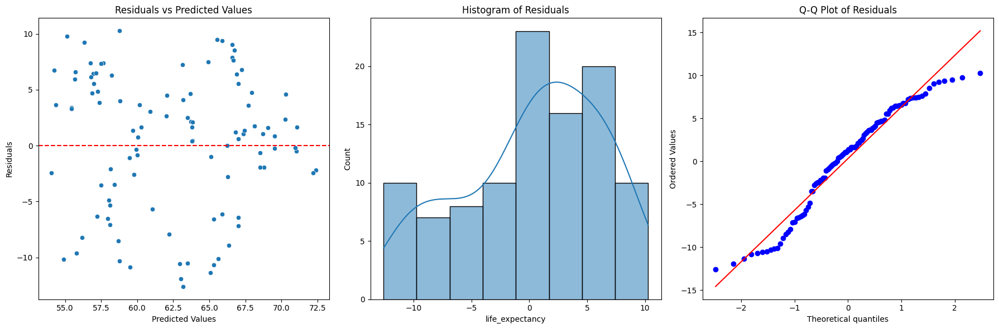

Breusch-Pagan Test Statistics: 36.9155534264495
Breusch-Pagan Test p-value: 1.1927858942903553e-05
                Variable       VIF
0                  const  1.000000
1      under_nourishment  1.643657
2     health_expenditure  1.332485
3  education_expenditure  1.197399
4           unemployment  1.337833
5           communicable  7.052822
6                    co2  6.867689
7   income_group_encoded  1.764914
8             corruption  1.222506


In [34]:
#1. Normal Distribution of Residuals
residuals = y_test - y_pred
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
# Residual Plot
sns.scatterplot(x=y_pred, y=residuals, ax=axes[0])
axes[0].axhline(0, color='r', linestyle='--')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals')
axes[0].set_title('Residuals vs Predicted Values')
# Histogram of residuals
sns.histplot(residuals, kde=True, ax=axes[1])
axes[1].set_title('Histogram of Residuals')
# Q-Q Plot
stats.probplot(residuals, dist="norm", plot=axes[2])
axes[2].set_title('Q-Q Plot of Residuals')
# Adjust layout
plt.tight_layout()
plt.show()

# 3. Check for Heteroscedasticity
# Add a constant term
X_train_with_const = sm.add_constant(X_train_scaled)
# Fit the linear regression model
linear_model = sm.OLS(y_train, X_train_with_const).fit()
# Breusch-Pagan Test
bp_test = sms.het_breuschpagan(linear_model.resid, linear_model.model.exog)
# Test result
bp_test_stat, bp_test_p_value, _, _ = bp_test
print(f"Breusch-Pagan Test Statistics: {bp_test_stat}")
print(f"Breusch-Pagan Test p-value: {bp_test_p_value}")


# 4. Check for Multicollinearity
# Add a constant term to the training data
X_with_const = sm.add_constant(X_train_scaled)
# Calculate VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = ['const'] + list(X.columns)  # Add 'const'
vif_data["VIF"] = [variance_inflation_factor(X_with_const, i) for i in range(X_with_const.shape[1])]
# Display VIF values
print(vif_data)

In [35]:
# Evaluate the model
from sklearn.metrics import r2_score
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

# 1. R²
r2 = r2_score(y_test, y_pred)
print(f"R²: {r2}")

#3. Mean Squared Error(MSE)
X_train_with_const = sm.add_constant(X_train_scaled)
linear_model = sm.OLS(y_train, X_train_with_const).fit()
y_train_pred = linear_model.predict(X_train_with_const)
X_test_with_const = sm.add_constant(X_test_scaled)
y_test_pred = linear_model.predict(X_test_with_const)
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
print(f"Training Mean Squared Error: {train_mse}")
print(f"Testing Mean Squared Error: {test_mse}")

R²: 0.37838018694162634
Training Mean Squared Error: 32.139282609081526
Testing Mean Squared Error: 36.34038584208773


In [36]:
# **Model 3: Exclude co2**

df_cleaned = df.dropna(subset=['under_nourishment', 'health_expenditure', 'education_expenditure',
                'unemployment', 'communicable', 'income', 'corruption']).copy()

# Processing categorical variable 'income'
income_group_mapping = {'Low income': 1, 'Lower middle income': 2, 'Upper middle income': 3, 'High income': 4}
df_cleaned['income_group_encoded'] = df_cleaned['income'].map(income_group_mapping)

# **Model 2: Exclude non_communicable, Add co2**
X = df_cleaned[['under_nourishment', 'health_expenditure', 'education_expenditure',
                'unemployment', 'communicable', 'income_group_encoded', 'corruption']]
y = df_cleaned['life_expectancy']

# Split into training and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the linear regression model
linear_model = LinearRegression()
linear_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred = linear_model.predict(X_test_scaled)

# Model evaluation
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error (Linear Regression) - Model 3: {mse}")

# **Save Model 2**
joblib.dump(linear_model, 'linear_model_3.pkl')
joblib.dump(scaler, 'scaler_3.pkl')

Mean Squared Error (Linear Regression) - Model 3: 37.05059253291656


['scaler_3.pkl']

In [ ]:
#linear_model_3 = joblib.load('linear_model_3.pkl')
#scaler_3 = joblib.load('scaler_3.pkl')

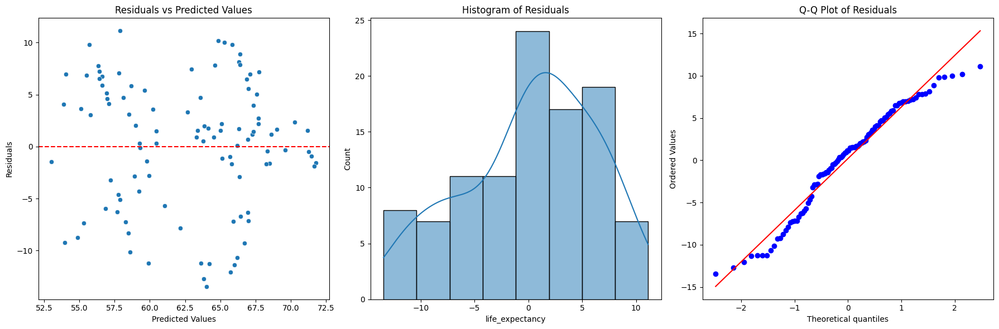

Breusch-Pagan Test Statistics: 28.552953946736462
Breusch-Pagan Test p-value: 0.00017451589279852972
                Variable       VIF
0                  const  1.000000
1      under_nourishment  1.628284
2     health_expenditure  1.307429
3  education_expenditure  1.195112
4           unemployment  1.335624
5           communicable  1.065253
6   income_group_encoded  1.731861
7             corruption  1.222042


In [37]:
#1. Normal Distribution of Residuals
residuals = y_test - y_pred
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
# Residual Plot
sns.scatterplot(x=y_pred, y=residuals, ax=axes[0])
axes[0].axhline(0, color='r', linestyle='--')
axes[0].set_xlabel('Predicted Values')
axes[0].set_ylabel('Residuals')
axes[0].set_title('Residuals vs Predicted Values')
# Histogram of residuals
sns.histplot(residuals, kde=True, ax=axes[1])
axes[1].set_title('Histogram of Residuals')
# Q-Q Plot
stats.probplot(residuals, dist="norm", plot=axes[2])
axes[2].set_title('Q-Q Plot of Residuals')
# Adjust layout
plt.tight_layout()
plt.show()

# 3. Check for Heteroscedasticity
# Add a constant term
X_train_with_const = sm.add_constant(X_train_scaled)
# Fit the linear regression model
linear_model = sm.OLS(y_train, X_train_with_const).fit()
# Breusch-Pagan Test
bp_test = sms.het_breuschpagan(linear_model.resid, linear_model.model.exog)
# Test result
bp_test_stat, bp_test_p_value, _, _ = bp_test
print(f"Breusch-Pagan Test Statistics: {bp_test_stat}")
print(f"Breusch-Pagan Test p-value: {bp_test_p_value}")


# 4. Check for Multicollinearity
# Add a constant term to the training data
X_with_const = sm.add_constant(X_train_scaled)
# Calculate VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = ['const'] + list(X.columns)  # Add 'const'
vif_data["VIF"] = [variance_inflation_factor(X_with_const, i) for i in range(X_with_const.shape[1])]
# Display VIF values
print(vif_data)

In [38]:
# Evaluate the model
from sklearn.metrics import r2_score
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error

# 1. R²
r2 = r2_score(y_test, y_pred)
print(f"R²: {r2}")

#3. Mean Squared Error(MSE)
X_train_with_const = sm.add_constant(X_train_scaled)
linear_model = sm.OLS(y_train, X_train_with_const).fit()
y_train_pred = linear_model.predict(X_train_with_const)
X_test_with_const = sm.add_constant(X_test_scaled)
y_test_pred = linear_model.predict(X_test_with_const)
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
print(f"Training Mean Squared Error: {train_mse}")
print(f"Testing Mean Squared Error: {test_mse}")

R²: 0.3662317592308084
Training Mean Squared Error: 33.92199655404379
Testing Mean Squared Error: 37.05059253291657


# Data Analysis of the Life Expectancy Dataset

The stepwise method for feature selection was not employed in this analysis due to its potential for overfitting. Overfitting occurs when the model becomes too tailored to the training data, resulting in poor generalization to unseen data.

Feature selection was instead guided by existing literature, which has identified key variables influencing life expectancy. The variables in our dataset are well-documented in prior studies as strong determinants of life expectancy.

However, one major challenge encountered during the analysis was **multicollinearity**. It was observed that some variables exhibit high correlations with each other, which can negatively impact the model's accuracy and interpretability. Typically, variables with a correlation coefficient above 0.7 should not be included together in the model to avoid this issue. In this dataset, the following high correlations were identified:

- Injuries and Non-Communicable Diseases: 0.95
- Injuries and Communicable Diseases: 0.77
- CO2 Emissions and Non-Communicable Diseases: 0.82
- Sanitation and Life Expectancy: 0.68

As a result of these high correlations, the variables "Injuries," "CO2," and "Sanitation" were excluded from the regression model.

Following this, I performed linear regression modeling on the cleaned dataset.

### Model Details:

- **Model 1:** Subset of features: ['under_nourishment', 'health_expenditure', 'education_expenditure', 'unemployment', 'communicable', 'non_communicable', 'income', 'corruption']
  - VIF (Variance Inflation Factor):
    - Communicable: 15.91
    - Non-communicable: 15.65
- **Model 2:** Subset of features: ['under_nourishment', 'health_expenditure', 'education_expenditure', 'unemployment', 'communicable', 'co2', 'income', 'corruption']
  - VIF:
    - Communicable: 7.05
    - CO2: 6.87
- **Model 3:** Subset of features: ['under_nourishment', 'health_expenditure', 'education_expenditure', 'unemployment', 'communicable', 'income', 'corruption']
  - R²: 0.37
  - Training Mean Squared Error: 33.92
  - Testing Mean Squared Error: 37.05

Both **Model 1** and **Model 2** exhibited high VIF values, which suggests potential multicollinearity problems. Consequently, I chose **Model 3**, which had a more reasonable R² value of 0.37 and relatively lower MSE values.

### Model 3 Results:
- R²: 0.37 indicates a moderate fit of the model to the data.
- The **Training Mean Squared Error** of 33.92 and **Testing Mean Squared Error** of 37.05 reflect that the model performs reasonably well but could still benefit from further refinement.

I believe that despite these metrics, **Model 3 offers the best balance** between feature selection and model performance. However, upon reflection, **the assumption of linearity in the relationships between variables may not be entirely appropriate**. A more complex model, such as a random forest or another non-linear model, could potentially improve performance further.

In conclusion, while **Model 3** was the best choice among the considered models based on the results, further exploration of non-linear models might be warranted for a more accurate representation of life expectancy.



